This Python Notebook is a part of paper "Creating maps by Artificial Intelligence - Case study on choropleth maps by ChatGPT-4"

---------------------------------------------------------------------------------------------------------------------------------------------------------------
Advanced prompt pattern for static map (4th session)

**DESCRIPTION**

The following code snippets were generated by ChatGPT-4 for creating a choropleth map of Burned areas in Portugal. This aims to examine then capability of AI in creating maps.
Each markdown is derievd from conversation interacted between author and ChatGPT-4. The markdown has specified the assessment of the code output if it "worked" or "failed" based on prompt requirements.
The last code block is the final output or the end of the prompt conversation. The final map will be exported as a .png file. See all prompts from the following chat's history >>>https://chat.openai.com/share/a6dc8f0f-dbde-4100-b8f0-daa6989db616<<<

**HOW TO USE**
1. Change the file path according to data's location on your computer.
2. Execute each script block
3. If the script raises an error, please skip it and run the next blocks to see the solved result. If the markdown indicates 'work' following by map element(s), it means the element(s) can be generated by specified prompt.

------------------------------------------------------------------------------------------------------------------------------------------------------------------

# **Prompt pattern: Cognitive verifier**

**When I ask you a question, generate three additional questions that would help you give a more accurate answer. When I have answered the three questions, combine the answers to produce the final answers to my original question.**

**From the given zip file, it consists of 2 shapefiles; 1. state boundary of Portugal named "boundary", and 2. mainlandburn represents the average burned area from 2002-2022shapefile each region in Portugal. Can you create a choropleth map of Average burned areas in each region, 2002-2022. The map should be created from Geopandas library mainly and give me a code to run in a local environment.**

1.Color Scheme Preferences: What color scheme would you like to use for the choropleth map? For example, would you prefer a gradient from light to dark colors based on the severity of the burned areas, or do you have specific colors in mind?

2.Map Features: Besides the average burned areas, are there any additional map features or annotations you would like included, such as region names, significant landmarks, or an inset map showing the location of Portugal in Europe?

3.Output Format: How would you like the output map? Are you looking for an interactive map (e.g., using Folium) that you can pan and zoom in a browser, or a static image file (e.g., PNG, JPEG) for presentation or publication purposes?

Answers 1. warm gradient from light to dark colors based on the severity of the burned areas, 2. I need additional map features and annotations that I would like included, such as state boundary, and region names. 3. static map

failed map/labels

AttributeError: Line2D.set() got an unexpected keyword argument 'legend_kwds'

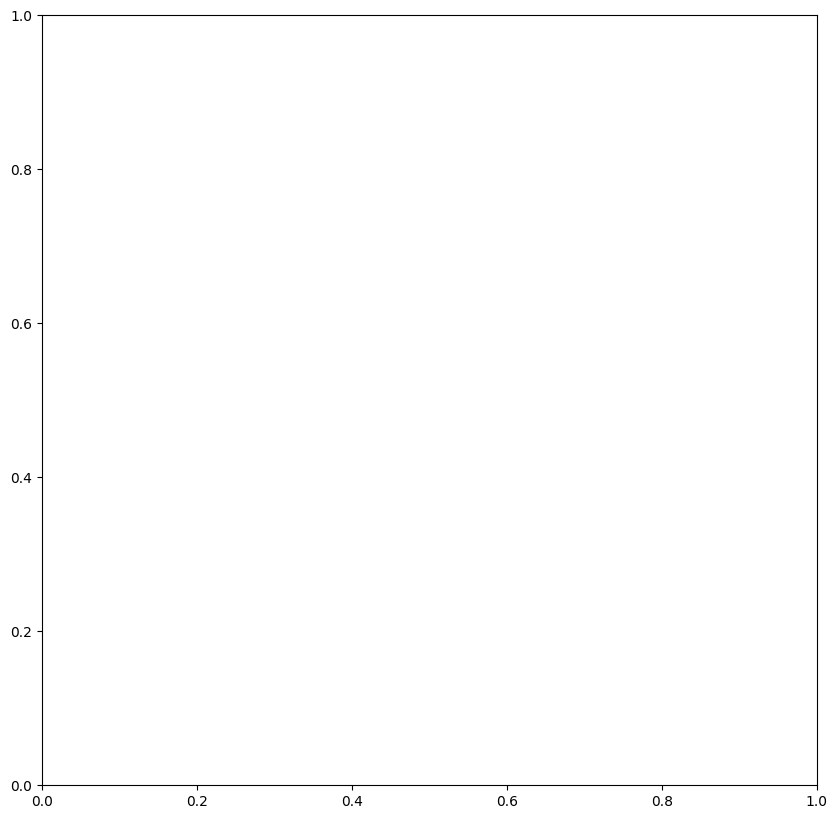

In [ ]:
import zipfile
import geopandas as gpd
import matplotlib.pyplot as plt

# # Unzipping the file
# with zipfile.ZipFile('/mnt/data/data_choropleth.zip', 'r') as zip_ref:
#     zip_ref.extractall('/mnt/data/data_choropleth')

# Loading the shapefiles
boundary_path = '/content/boundary.shp'
burned_area_path = '/content/mainlandburn.shp'

boundary = gpd.read_file(boundary_path)
burned_area = gpd.read_file(burned_area_path)

# Note: Replace 'region_name' with the actual column name that represents the region names in your shapefiles.
merged_data = boundary.merge(burned_area, on='NAME_1')

# Creating the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
merged_data.plot(column='average_burned_area', ax=ax, legend=True,
                 legend_kwds={'label': "Average Burned Area (2002-2022)"},
                 cmap='OrRd', scheme='natural_breaks')

# Adding region names to the map
for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data['region_name']):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")

plt.title('Average Burned Areas by Region in Portugal (2002-2022)')

plt.show()


**it does not work, do not merge the geodataframe. Ask me 3 additional questions**

1.Data Structure and Contents: Can you confirm the structure of the attribute table for both shapefiles? Specifically, for the "mainlandburn" shapefile, what are the names of the columns, especially the one representing the average burned area? For the "boundary" shapefile, how are the regions named or identified?

2.Projection Details: Do both shapefiles use the same spatial projection? If not, do you have a preferred projection for displaying the map?

3.Technical Specifics: Have you encountered any specific errors or technical challenges when trying to load, merge, or visualize the data in GeoPandas that you can share? This could help in troubleshooting and ensuring the provided code addresses these issues directly.


1. "Burned_Are is "the name of the columns representing the average burned area. 2. I prefer the same projection as represents in the basemap. 3.  do not merge data

failed map

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from zipfile import ZipFile

# # Extract the zip file
# zip_path = '/mnt/data/data_choropleth.zip'
# extract_folder = '/mnt/data/extracted_data/'

# with ZipFile(zip_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_folder)
# Loading the shapefiles
boundary_path = '/content/boundary.shp'
burned_area_path = '/content/mainlandburn.shp'
# # Load the shapefiles
# boundary_path = extract_folder + 'boundary.shp'
# mainlandburn_path = extract_folder + 'mainlandburn.shp'

boundary_gdf = gpd.read_file(boundary_path)
burned_area_gdf = gpd.read_file(burned_area_path)

# Print the first few rows of each GeoDataFrame to check the structure
print("Boundary GDF head:")
print(boundary_gdf.head())
print("\nMainlandburn GDF head:")


# Ensure projection alignment with basemap - this step will align the projection with your preferred basemap
# Assuming the basemap uses a common projection like WGS84
burned_area_gdf = burned_area_gdf.to_crs(epsg=4326)
boundary_gdf = boundary_gdf.to_crs(epsg=4326)

# Visualization code will follow based on your confirmation of the structure and contents


Boundary GDF head:
  GID_0    NAME_0    GID_1  NAME_1 VARNAME_1 NL_NAME_1    TYPE_1 ENGTYPE_1  \
0   PRT  Portugal  PRT.1_1  Aveiro      None      None  Distrito  District   

  CC_1 HASC_1  BUFF_DIST  ORIG_FID  \
0   01  PT.AV     2000.0         0   

                                            geometry  
0  MULTIPOLYGON (((-9.47816 39.42184, -9.47814 39...  

Mainlandburn GDF head:


In [ ]:
pip install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 36.3 MB/s eta 0:00:00


**it does not plot any maps, create a choropleth map together base map. Ask me 3 additional questions**

1.Base Map Preferences: What specific base map would you like to use for the background? Options include simple basemaps such as those provided by contextily or specific tile maps (e.g., OpenStreetMap, Stamen Terrain, Google Maps). Your preference will help in selecting the appropriate service or package.

2.Region Label Preferences: For labeling the regions, would you prefer labels placed at the centroid of each region for clarity, or is there another specific way you'd like the labels to be displayed?

3.Burned Area Representation: Given the "Burned_Are" column represents the average burned area, how would you like areas with no data or zero values to be represented on the map? Should they be given a distinct color, or simply left blank?


1. CartoDB, 2. I would like you to label each district name on the map. 3. all column has data

work labels/basemap/map

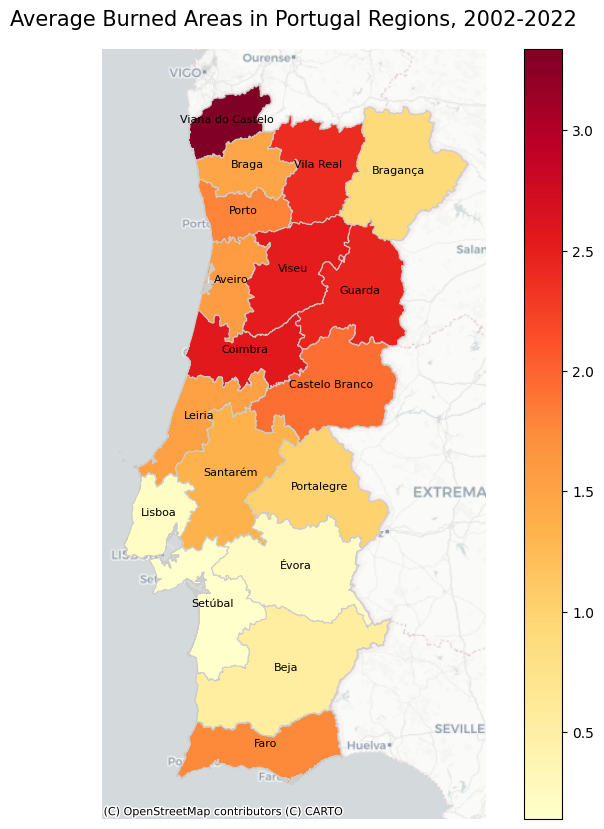

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# Assuming the structure and projection alignment from the previous step

# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')

# Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map
mainlandburn_gdf.plot(column='Burned_Are', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Average Burned Areas in Portugal Regions, 2002-2022', fontdict={'fontsize': '15', 'fontweight' : '3'})

# Add labels for each region
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(text=row['NAME_1'], xy=(row['geometry'].centroid.x, row['geometry'].centroid.y), ha='center', fontsize=8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove x and y axis
ax.set_axis_off()

# Show plot
plt.show()


**Can you adjust the labels to have white halo effects and reduce the font size smaller? Ask me 3 additional questions**

1.Font Size: What specific font size would you prefer for the labels? The current size is set to 8, which you've requested to be made smaller. Would a size of 6 or another value be more appropriate for your needs?

2.Halo Thickness: How thick or prominent would you like the white halo effect around the text to be? This can be adjusted to ensure the labels stand out against various backgrounds.

3.Label Placement Strategy: Considering that labels placed directly at the centroid might sometimes fall outside irregular shapes or overlap with adjacent labels, would you like to implement any specific strategy to avoid such issues, or is the current centroid-based placement acceptable?

1. size 6 2. medium thickness 3. the current centroid is ok

failed labels

TypeError: annotate() missing 1 required positional argument: 'text'

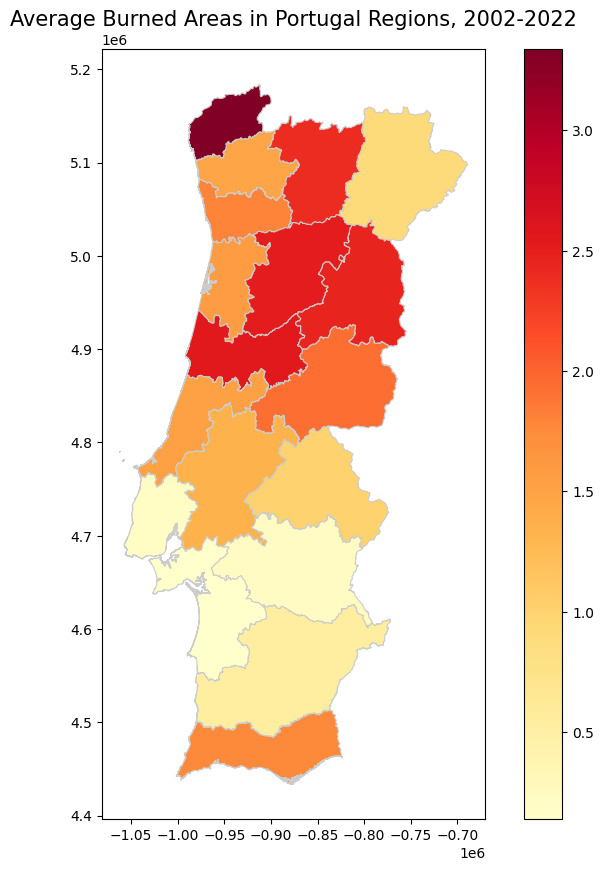

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal

# # Load the mainlandburn shapefile (adjust the path as necessary)
# mainlandburn_gdf = gpd.read_file('/mnt/data/extracted_data/mainlandburn.shp')

# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
# mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map
mainlandburn_gdf.plot(column='Burned_Are', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Average Burned Areas in Portugal Regions, 2002-2022', fontdict={'fontsize': '15', 'fontweight' : '3'})

# Add labels for each region with a white halo effect for better readability
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        s=row['NAME_1'],
        xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove x and y axis
ax.set_axis_off()

# Show plot
plt.show()


**debug this code "TypeError: annotate() missing 1 required positional argument: 'text'"**

work labels

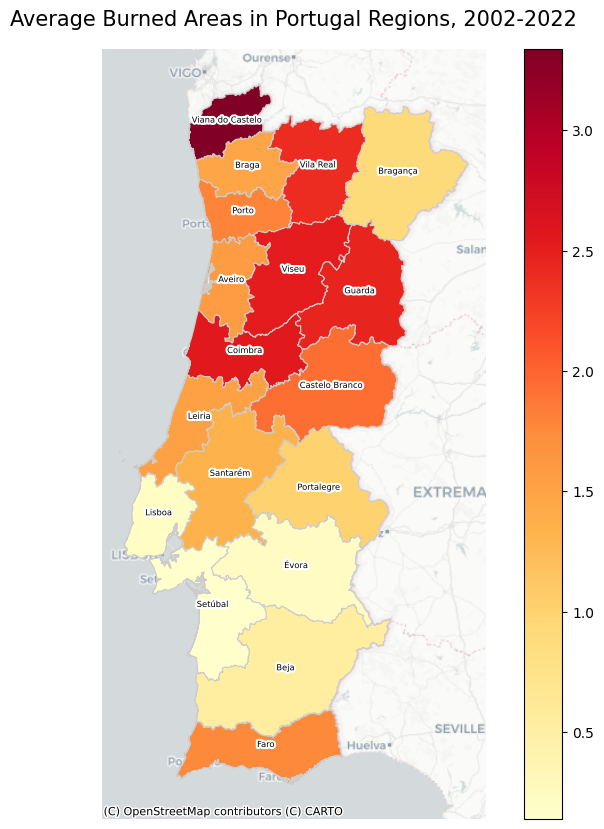

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal

# # Load the mainlandburn shapefile (adjust the path as necessary)
# mainlandburn_gdf = gpd.read_file('/mnt/data/extracted_data/mainlandburn.shp')

# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
# mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map
mainlandburn_gdf.plot(column='Burned_Are', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Average Burned Areas in Portugal Regions, 2002-2022', fontdict={'fontsize': '15', 'fontweight': '3'})

# Add labels for each region with a white halo effect for better readability
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Corrected from s= to text=
        xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove x and y axis
ax.set_axis_off()

# Show plot
plt.show()


**From the previous code, can you change the continuous legend to a discrete legend ranging the value from high to low of 5 classes? Ask me 3 additional question**

1.Classification Method: Which method would you prefer for classifying the burned area data into five classes? Common methods include natural breaks (Jenks), quantiles, equal intervals, or manual breaks. Each method can impact the map's interpretation differently.

2.Legend Details: How would you like the legend to be labeled for these five classes? Would you prefer generic labels (e.g., Very High, High, Moderate, Low, Very Low), or labels indicating the specific range of values in each class?

3.Color Map Adjustment: Given the shift to a discrete legend, do you have any preference for adjusting the color map used for the five classes? We can maintain a warm gradient or opt for distinct colors for each class to emphasize differences.

1. I need equal intervals 2. legend labels indicating the specific range of values in each class, the lower values to be unique from the upper values of the next class. 3. use the same color scheme, but distinct colors for each class to emphasize differences

failed legend[map/legend]

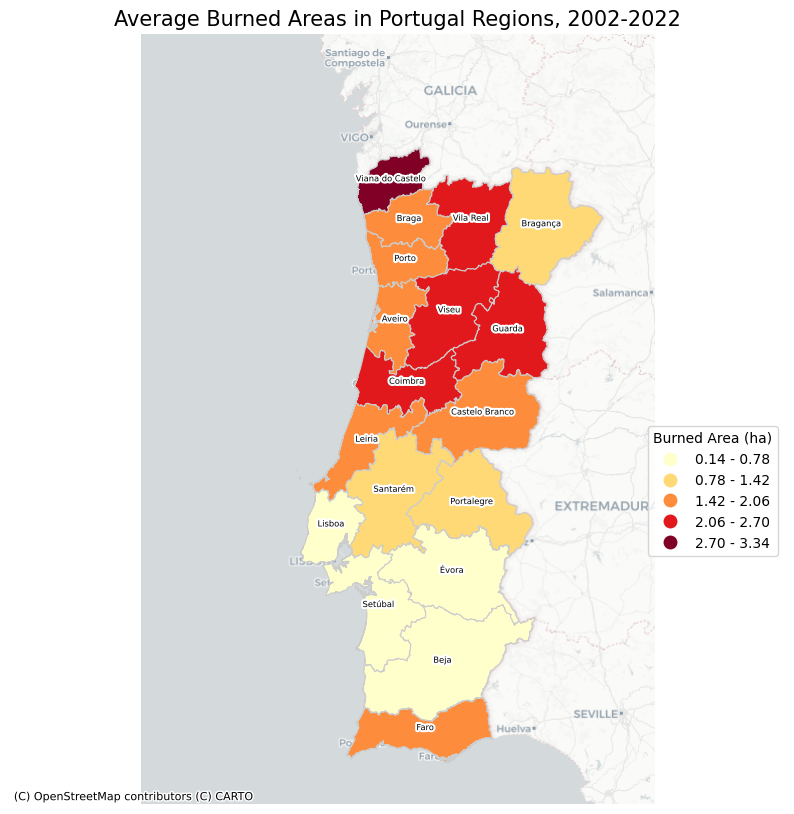

''

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
import numpy as np
import pandas as pd

# # Load the mainlandburn shapefile (adjust the path as necessary)
# mainlandburn_gdf = gpd.read_file('/mnt/data/extracted_data/mainlandburn.shp')

# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
# mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)

# Determine equal interval classification for 'Burned_Are'
interval_range = np.linspace(mainlandburn_gdf['Burned_Are'].min(), mainlandburn_gdf['Burned_Are'].max(), num=6)
mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=False)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Adjust legend with specific ranges
legend_labels = [f'{interval_range[i]:.2f} - {interval_range[i+1]:.2f}' for i in range(len(interval_range)-1)]
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 0.5))
leg.set_title('Burned Area (ha)')
for text, label in zip(leg.get_texts(), legend_labels):
    text.set_text(label)

ax.set_title('Average Burned Areas in Portugal Regions, 2002-2022', fontdict={'fontsize': '15', 'fontweight' : '3'})

# Add labels for each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove x and y axis
ax.set_axis_off()
plt.axis("equal")
# Show plot
plt.show()
_

**...From this code, I would like specific labels for each class in the legend, edit the legend of the lower values to be unique from the upper values of the next class. Ask me 3 additional questions**

1.Range Adjustment Preference: How would you like the ranges adjusted to ensure uniqueness between adjacent classes? For example, if one class ends at 100, should the next class start at 100.01, or would you prefer rounding to avoid decimal places, thus making the next class start at 101?

2.Label Format: For the numeric values in the legend labels, do you have a preference for the number of decimal places or rounding? This could help in maintaining consistency with your dataset's precision and readability of the map.

3.Legend Placement: Considering the adjustment to the legend, do you have any specific preferences for its placement or size on the map? This could include positioning the legend inside or outside the map area, or adjustments to ensure it does not obscure important map details.

1.For example, if one class ends at 100, should the next class start at 100.01, 2.i need 2 decimals 3.place the legend box to the upper right of the map

failed legend

AttributeError: 'Legend' object has no attribute 'set_texts'

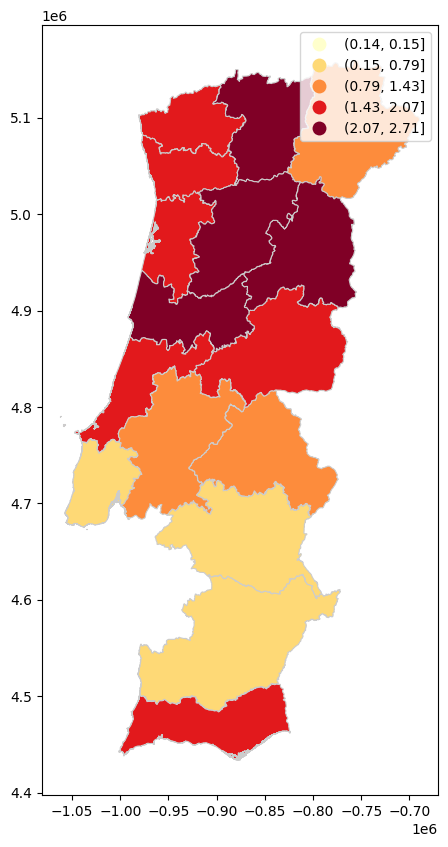

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
import numpy as np

# # Load the mainlandburn shapefile (adjust the path as necessary)
# mainlandburn_gdf = gpd.read_file('/mnt/data/extracted_data/mainlandburn.shp')

# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
# mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)

# Determine class intervals with equal intervals method
num_classes = 5
max_value = mainlandburn_gdf['Burned_Are'].max()
min_value = mainlandburn_gdf['Burned_Are'].min()
interval = (max_value - min_value) / num_classes
# Create bins for each class, ensuring unique ranges by slightly adjusting the lower bound of each subsequent class
bins = [min_value + interval * i for i in range(num_classes)] + [max_value]
# Adjust bins to ensure uniqueness at class boundaries
bins = [bin if i == 0 else bins[i-1] + 0.01 for i, bin in enumerate(bins)]

# Categorize data
mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins, precision=2)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Customize the legend
leg = ax.get_legend()
labels = mainlandburn_gdf['class'].cat.categories
new_labels = [f"{label.left:.2f} - {label.right:.2f}" for label in labels]
leg.set_texts(new_labels)
leg.set_bbox_to_anchor((1, 1))

# Add labels for each region with a white halo effect for better readability
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        s=row['NAME_1'],  # Assuming 'NAME' is the correct column for region names
        xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove x and y axis
ax.set_axis_off()

# Show plot
plt.show()


**fix this error "AttributeError: 'Legend' object has no attribute 'set_texts'"**

failed legend

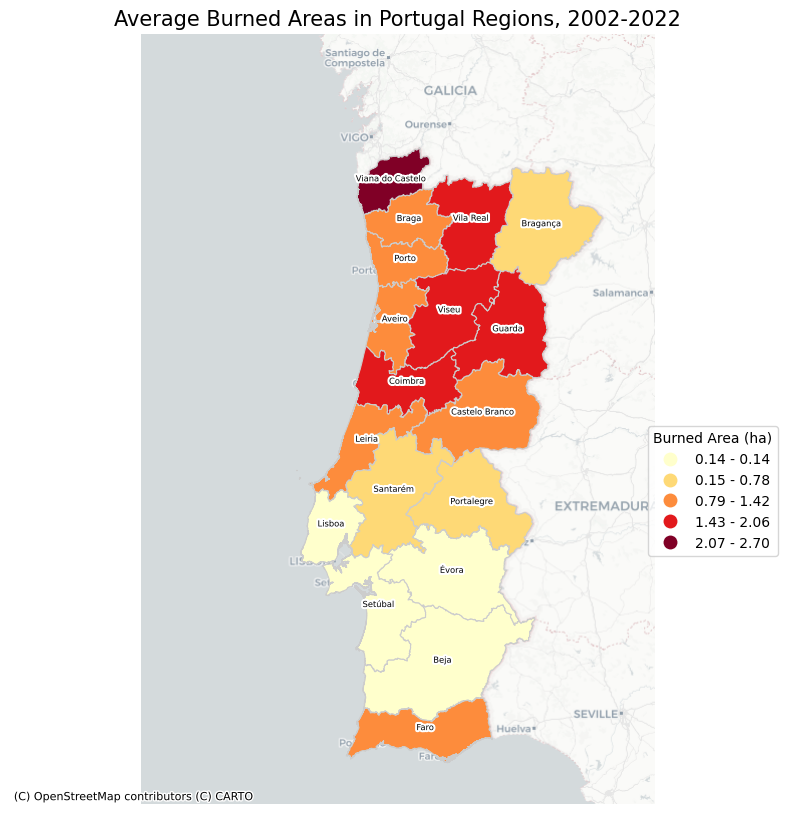

''

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
import numpy as np
import pandas as pd

# # Load the mainlandburn shapefile (adjust the path as necessary)
# mainlandburn_gdf = gpd.read_file('/mnt/data/extracted_data/mainlandburn.shp')

# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
# mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)

# Determine equal interval classification for 'Burned_Are'
interval_range = np.linspace(mainlandburn_gdf['Burned_Are'].min(), mainlandburn_gdf['Burned_Are'].max(), num=6)
mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=False)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Adjust legend with specific ranges
legend_labels = [f"{bins[i]:.2f} - {bins[i+1]-0.01:.2f}" for i in range(len(bins)-1)]

leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 0.5))
leg.set_title('Burned Area (ha)')
for text, label in zip(leg.get_texts(), legend_labels):
    text.set_text(label)


ax.set_title('Average Burned Areas in Portugal Regions, 2002-2022', fontdict={'fontsize': '15', 'fontweight' : '3'})

# Add labels for each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove x and y axis
ax.set_axis_off()
plt.axis("equal")
# Show plot
plt.show()
_

**Reclassify the legend's label to correspond with class on the map which uses Equal interval. Ask me 3 additional questions**

1.Legend Detail Adjustment: For the equal interval classes, would you like the legend to explicitly show the range of values for each class (e.g., "0-20", "20.01-40", etc.) instead of general category names or numerical identifiers?

2.Map Aesthetics: Considering the changes to the legend, are there any additional adjustments to the map's aesthetics you'd like to incorporate? This could include changes to the font styles, map edge color, or any other visual element.

3.Interactivity vs. Static Display: While your previous preference was for a static map, does the inclusion of detailed legend labels and adjustments to map aesthetics change your interest towards an interactive display, or do you remain focused on a static presentation?

1. For the equal interval classes, I would like the legend to explicitly show the 5 range of values for each class (e.g., "0.13-0.78", "0.79-1.42, 1.43-2.06", etc.). 2. no specific style 3. Remove the white background of the legend and change the legend's name to "Burned area per region[ha/km²]"

failed legend

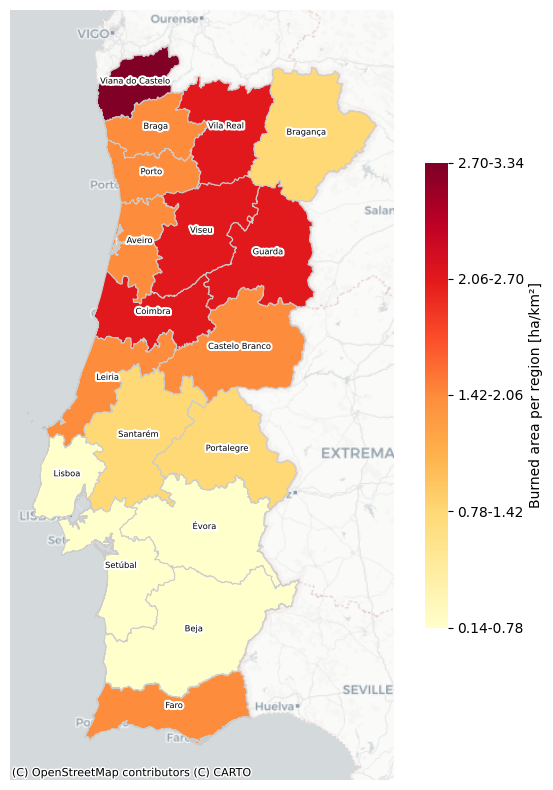

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase
from matplotlib.cm import ScalarMappable
import numpy as np
import pandas as pd

# Assuming mainlandburn_gdf is your GeoDataFrame after projection to EPSG:3857
# If not yet loaded or projected, you'll need to adjust the loading and projection steps accordingly

# Calculate equal interval bins
num_classes = 5
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = mainlandburn_gdf['Burned_Are'].max()
intervals = np.linspace(min_value, max_value, num_classes + 1)

# Create a new column for categorized data
mainlandburn_gdf['category'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=intervals, include_lowest=True, labels=False)

# Create labels for the legend
labels = [f"{intervals[i]:.2f}-{intervals[i+1]:.2f}" for i in range(len(intervals)-1)]

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
mainlandburn_gdf.plot(column='category', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Custom legend
cmap = plt.cm.YlOrRd
norm = Normalize(vmin=0, vmax=num_classes - 1)
sm = ScalarMappable(norm=norm, cmap=cmap)
# Fake up the array of the scalar mappable
sm._A = []
cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.04)
cbar.set_ticks(range(num_classes))
cbar.set_ticklabels(labels)
cbar.set_label('Burned area per region [ha/km²]')
cbar.solids.set_edgecolor("face")

# Remove the white background from the legend
cbar.outline.set_visible(False)

# Label each region
# Add labels for each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Remove axis
ax.set_axis_off()

plt.show()


**...From this code, edit the legend from continuous to discrete classes**

failed legend

TypeError: annotate() missing 1 required positional argument: 'text'

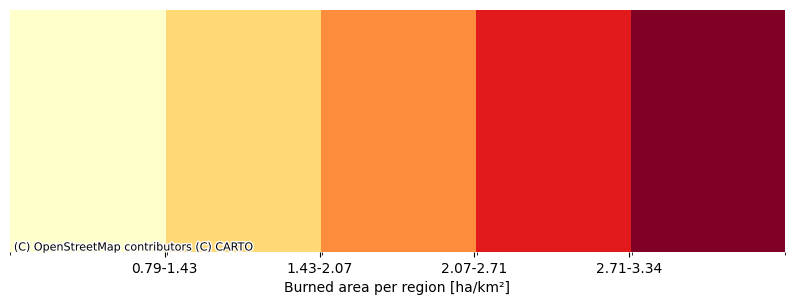

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.colors import Normalize, BoundaryNorm
from matplotlib.colorbar import ColorbarBase
from matplotlib.cm import ScalarMappable
import numpy as np
import pandas as pd

# Assuming mainlandburn_gdf is your GeoDataFrame after projection to EPSG:3857
# Calculate equal interval bins
num_classes = 5
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = mainlandburn_gdf['Burned_Are'].max()
intervals = np.linspace(min_value, max_value, num_classes + 1)

# Adjust the intervals slightly to make lower value of a class unique from the upper value of the next class
adjusted_intervals = np.round(intervals, 2)  # Round to 2 decimals for consistency
adjusted_intervals[1:-1] = adjusted_intervals[1:-1] + 0.01  # Adjust for uniqueness

# Create a new column for categorized data based on adjusted intervals
mainlandburn_gdf['category'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=adjusted_intervals, include_lowest=True, labels=False)

# Create labels for the legend with unique ranges
labels = [f"{adjusted_intervals[i]:.2f}-{adjusted_intervals[i+1]:.2f}" for i in range(len(adjusted_intervals)-1)]

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
mainlandburn_gdf.plot(column='category', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Custom legend with discrete classes
cmap = plt.get_cmap('YlOrRd', num_classes)
norm = BoundaryNorm(adjusted_intervals, cmap.N, clip=True)
sm = ScalarMappable(norm=norm, cmap=cmap)

# Fake up the array of the scalar mappable.
sm._A = []
cbar = ColorbarBase(ax, cmap=cmap, norm=norm, boundaries=adjusted_intervals, ticks=np.arange(min_value, max_value, (max_value-min_value)/num_classes), spacing='proportional', orientation='horizontal')
cbar.set_ticklabels(labels)
cbar.set_label('Burned area per region [ha/km²]')
cbar.solids.set_edgecolor("face")

# Remove the white background from the legend
cbar.outline.set_visible(False)

# Label each region
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        s=row['NAME_1'],  # Replace 'NAME' with your column name if different
        xy=(row['geometry'].centroid.coords[0][0], row['geometry'].centroid.coords[0][1]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()],
    )

# Remove axis
ax.set_axis_off()

plt.show()


**....Duplicate this code and reclassify the 5 legend classes to equal interval as the map. Ask me 3 additional questions**


1.Legend Clarity and Format: In the revised approach for the legend, do you want the upper bound of one class and the lower bound of the next class to be exactly the same (e.g., "0.00-0.20", "0.20-0.40", etc.), or should there be a minimal difference to emphasize separation (e.g., "0.00-0.19", "0.20-0.39", etc.)?

2.Map and Legend Integration: Given the modifications to the legend, would you like any adjustments to how the map and legend are integrated? This could involve changing the legend's position, size, or how it's anchored relative to the map to improve overall readability and aesthetics.

3.Additional Data Insights: Are there any other data insights or annotations you'd like to add to the map to enhance its informational value? For example, this could include highlighting specific regions with notably high or low burned areas, adding a scale bar, or incorporating additional geographical features.

1. want the upper bound of one class and the lower bound of the next class to be a minimal difference to emphasize separation (e.g., "0.00-0.19", "0.20-0.39", etc.). 2. the legend to the upper right of the map. 3.no

work legend

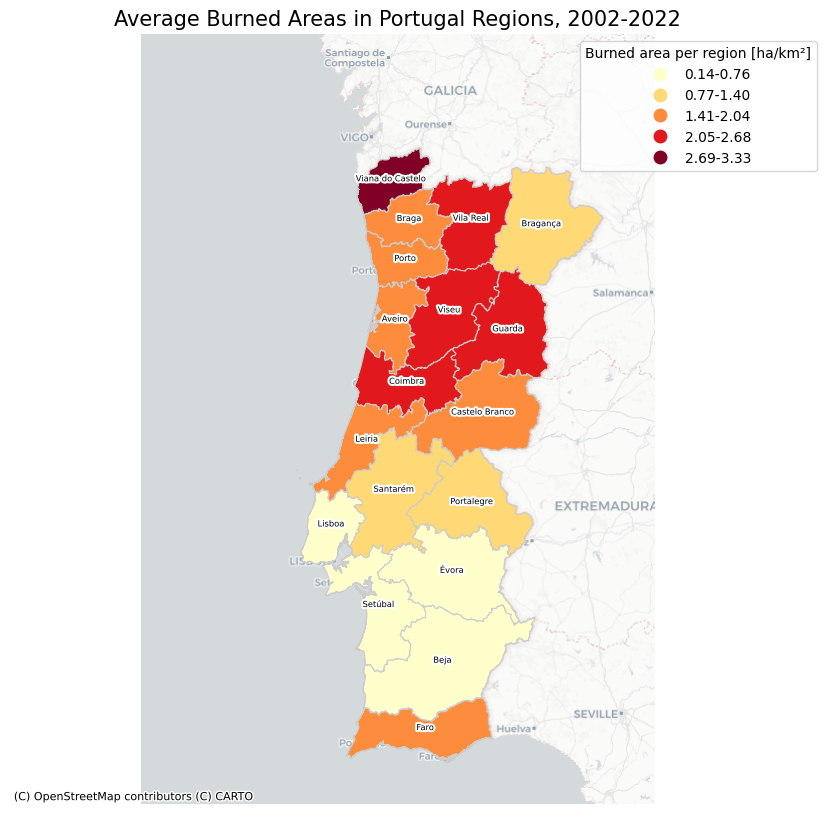

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
import numpy as np
import pandas as pd

# Assuming mainlandburn_gdf has been correctly loaded and projected to EPSG:3857

# Determine equal interval classification for 'Burned_Are', ensuring minimal difference between classes
num_classes = 5
interval_range = np.linspace(mainlandburn_gdf['Burned_Are'].min(), mainlandburn_gdf['Burned_Are'].max(), num=num_classes+1)
# Adjust intervals to ensure minimal difference between the upper bound of one class and the lower bound of the next
interval_range[1:-1] = interval_range[1:-1] - 0.01
mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=False)

# Generate labels for the legend with specified ranges
interval_labels = [f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)]

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Custom legend - manually create a legend with the adjusted labels
legend = ax.get_legend()
legend.set_bbox_to_anchor((1.05, 1))
legend.set_title("Burned area per region [ha/km²]")
# Update legend labels with the generated interval labels
legend.get_texts()[0].set_text(interval_labels[0])
legend.get_texts()[1].set_text(interval_labels[1])
legend.get_texts()[2].set_text(interval_labels[2])
legend.get_texts()[3].set_text(interval_labels[3])
legend.get_texts()[4].set_text(interval_labels[4])

ax.set_title('Average Burned Areas in Portugal Regions, 2002-2022', fontdict={'fontsize': '15', 'fontweight' : '3'})

# Add labels for each region with a white halo effect for readability
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add CartoDB base map and set legend to the upper right
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_axis_off()
plt.axis("equal")

# Show the plot
plt.show()


**The maximum value is supposed to be 3.34 not 3.33.** failed legend

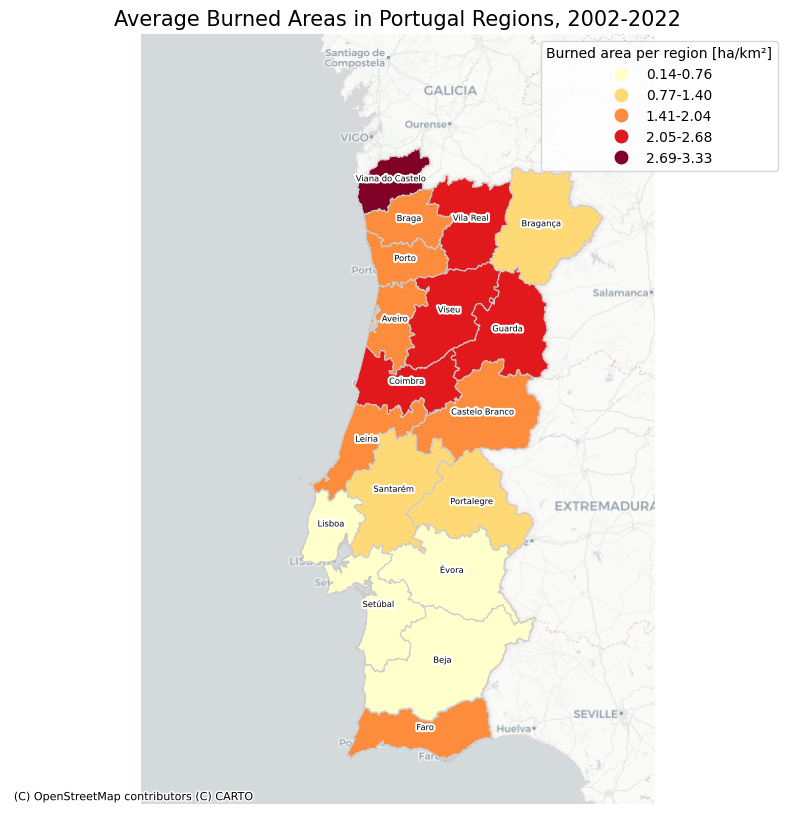

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
import numpy as np
import pandas as pd

# Assuming mainlandburn_gdf is your GeoDataFrame after projection to EPSG:3857

# Correct the maximum value for classification
max_value_corrected = 3.34

# Determine equal interval classification for 'Burned_Are', ensuring minimal difference between classes
num_classes = 5
interval_range = np.linspace(mainlandburn_gdf['Burned_Are'].min(), max_value_corrected, num=num_classes + 1)

# Adjust intervals to ensure minimal difference between the upper bound of one class and the lower bound of the next
# This adjustment ensures there's no overlap between classes
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Adjust legend to the upper right of the map
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')

# Set title
ax.set_title('Average Burned Areas in Portugal Regions, 2002-2022', fontdict={'fontsize': '15', 'fontweight' : '3'})

# Add labels for each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove x and y axis
ax.set_axis_off()
plt.axis("equal")

# Show plot
plt.show()


**it still shows 3.33 not 3.34.**
failed legend

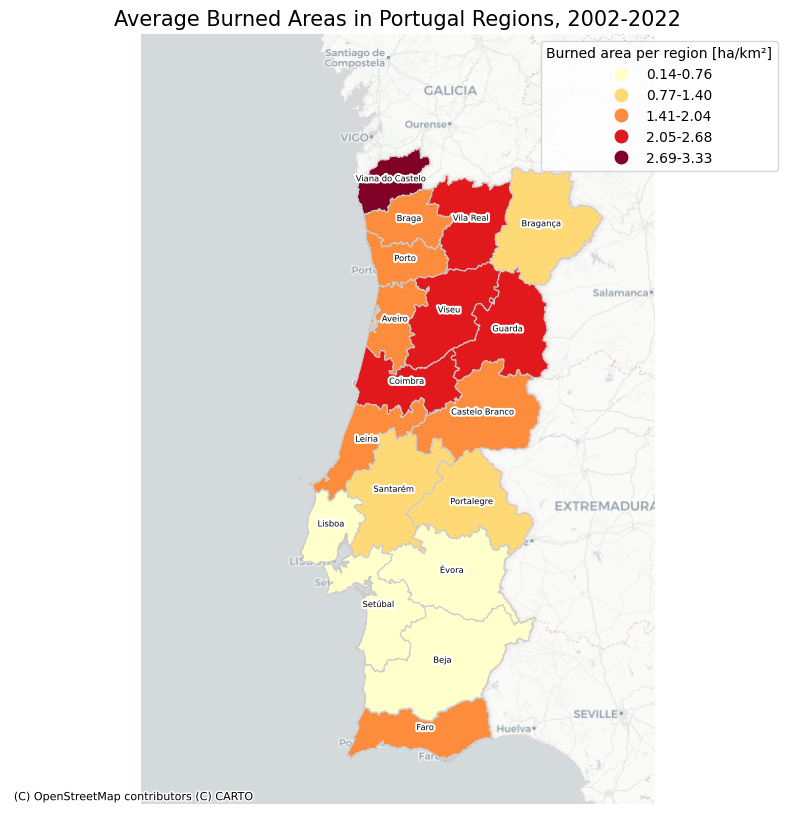

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
import numpy as np
import pandas as pd

# Assuming the mainlandburn_gdf is pre-loaded and converted to the correct CRS (Web Mercator)

# Correctly setting the max value
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly setting the max value as indicated

# Determine equal interval classification for 'Burned_Are' with adjusted max_value
interval_range = np.linspace(min_value, max_value, num=6)
# Adjust intervals to ensure minimal difference and emphasize separation
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes, using 'class' as the category
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Adjust legend to display in the upper right of the map
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')

ax.set_title('Average Burned Areas in Portugal Regions, 2002-2022', fontdict={'fontsize': '15', 'fontweight': '3'})

# Add labels for each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove x and y axis
ax.set_axis_off()
plt.axis("equal")

# Show plot
plt.show()


**From the previous code, can you add the state boundary with dark brown color to the legend also, below the burned area? Ask me 3 additional questions**

1.Boundary Thickness: What thickness would you like for the state boundary lines? This will ensure they are appropriately visible against the base map and choropleth classifications.

2.Legend Label for State Boundary: How would you like the state boundary to be labeled in the legend? For example, "State Boundary" or another specific term that accurately represents these lines.

3.Boundary Line Style: Would you prefer the state boundary lines to be solid, dashed, or another style? This can help differentiate them from other map features or emphasize their significance.

1. the thickness is the same level as the state boundary in map 2.State Boundary 3. I prefer the state boundary lines to be solid

failed legend

ValueError: 'darkbrown' is not a valid color value.

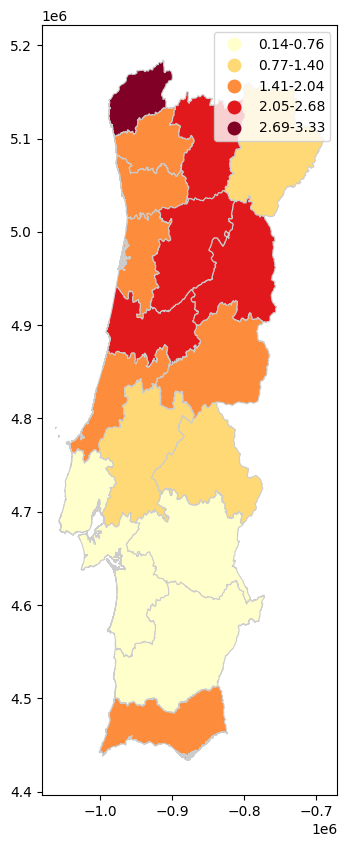

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd

# Assuming mainlandburn_gdf and boundary_gdf are pre-loaded and correctly projected (EPSG:3857)

# Determine equal interval classification for 'Burned_Are' and adjust intervals for separation
min_value, max_value = mainlandburn_gdf['Burned_Are'].min(), 3.34  # Explicit max value adjustment
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)  # Ensure separation between classes

# Create categories for coloring
mainlandburn_gdf['category'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth
mainlandburn_gdf.plot(column='category', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot the state boundary
boundary_gdf.plot(ax=ax, edgecolor='darkbrown', linewidth=0.8, linestyle='-', label='State Boundary')

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Customize legend for burned area categories
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned Area (ha)')

# Add custom legend for state boundary
custom_lines = [Line2D([0], [0], color='darkbrown', lw=2, linestyle='-')]
ax.legend(custom_lines, ['State Boundary'], loc='upper right', bbox_to_anchor=(1, 0.9))

# Add region labels with white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

ax.set_axis_off()
plt.show()


**ValueError: 'darkbrown' is not a valid color value.**
failed map/legend

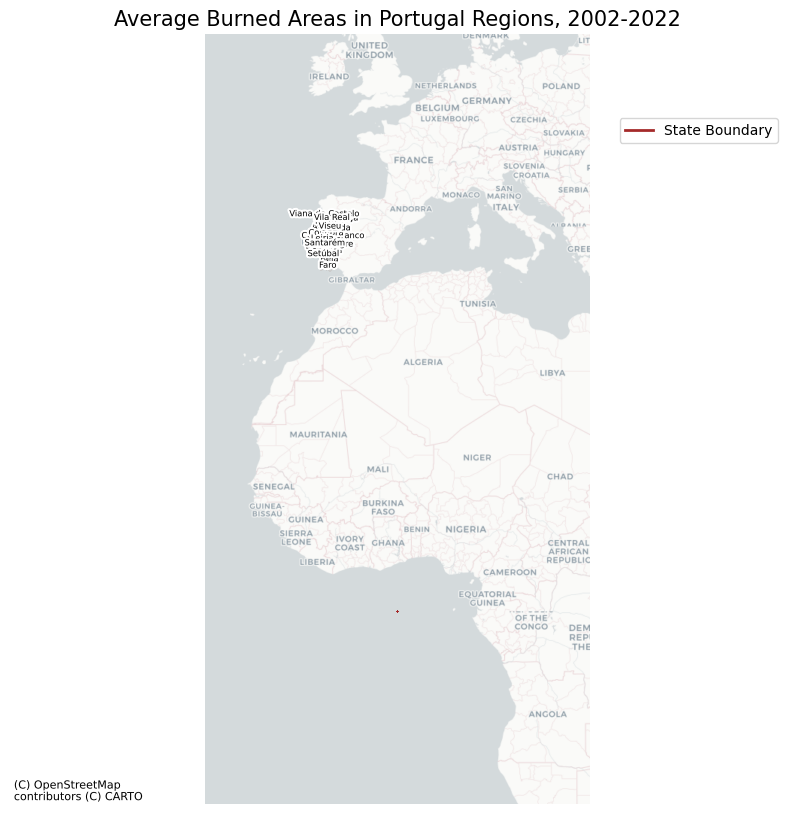

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
import numpy as np
import pandas as pd

# Assuming the mainlandburn_gdf is pre-loaded and converted to the correct CRS (Web Mercator)
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
# Correctly setting the max value
# Determine equal interval classification for 'Burned_Are' and adjust intervals for separation
min_value, max_value = mainlandburn_gdf['Burned_Are'].min(), 3.34  # Explicit max value adjustment
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)  # Ensure separation between classes

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes, using 'class' as the category
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)
# Plot the state boundary in brown color
boundary_gdf.plot(ax=ax, edgecolor='brown', linewidth=0.8, linestyle='-', label='State Boundary')

# Adjust legend to display in the upper right of the map
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')
# Add custom legend for state boundary
custom_lines = [Line2D([0], [0], color='brown', lw=2, linestyle='-')]
ax.legend(custom_lines, ['State Boundary'], loc='upper right', bbox_to_anchor=(1, 0.9))

ax.set_title('Average Burned Areas in Portugal Regions, 2002-2022', fontdict={'fontsize': '15', 'fontweight': '3'})

# Add labels for each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove x and y axis
ax.set_axis_off()
plt.axis("equal")

# Show plot
plt.show()


**From this code, add a state line boundary to the map legend. Ask me 3 additional questions**

1.State Boundary Data Source: Could you confirm if the state boundary data is included within the "mainlandburn_gdf" GeoDataFrame, or is it located in a separate GeoDataFrame? If it's separate, please provide the variable name for that GeoDataFrame.

2.Legend Integration Method: Given that matplotlib's legend is typically used for categorical data and plotting lines directly within the legend can be less straightforward, would you prefer a custom approach to integrate the state boundary into the legend, such as manually creating a legend entry for it?

3.Visual Representation of State Boundary: Since the map will now include a distinct representation for the state boundary, is there a specific color or line style (other than the solid brown line already discussed) that you'd like to use for this purpose to distinguish it from other elements on the map?

1. it located in a separate GeoDataFrame which is "boundary" 2.plotting lines directly within the legend 3. solid brown line

failed legend [map/legend]

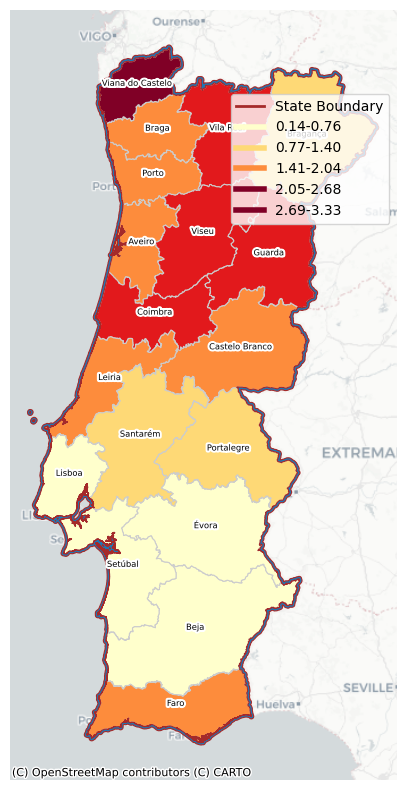

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd

# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Customize legend for burned area
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')

# Custom legend items for both burned area and state boundary
legend_elements = [Line2D([0], [0], color='brown', lw=2, label='State Boundary')] + [Line2D([0], [0], color=cmap(norm(i)), lw=4, label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(len(interval_range)-1)]
ax.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1, 0.9))

# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

ax.set_axis_off()
plt.show()


**Change the burned area classes in the legend from line to rectangle box. Ask me 3 additional questions**

1.Legend Size for Rectangle Boxes: For the rectangle boxes representing burned area classes, what size do you envision for these boxes within the legend? This can help in making sure they are appropriately visible without overwhelming other map elements.

2.Legend Box Edge Color: Would you like the edge color of these rectangle boxes to match their fill color, or would you prefer a standard color (e.g., black or white) for the edges to maintain consistency and enhance visibility?

3.Arrangement of Legend Entries: With the addition of rectangle boxes for burned area classes and the state boundary represented by a line, how would you like these different elements arranged within the legend? Is a particular order or grouping important to you for clarity and readability?

1. default size. 2.the edge color of these rectangle boxes to match the map color. 3. i would like these different elements arranged within the legend by the state line placed at the last order

work legend

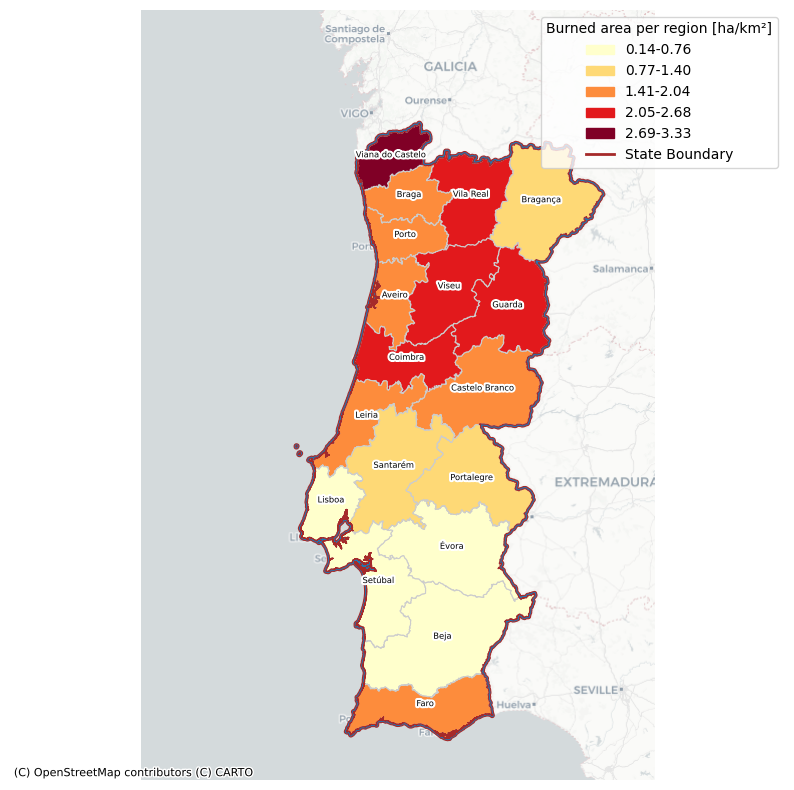

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd

# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )
plt.axis("equal")
ax.set_axis_off()
plt.show()


**can you a scale bar on the map? Ask me 3 additional questions
ChatGPT**

1.Scale Bar Location: Where would you prefer the scale bar to be located on the map? Common options include the lower right corner, lower left corner, or another specific location based on the map's layout and content.

2.Scale Bar Units: What units would you like the scale bar to display? Options typically include kilometers, miles, or both, depending on the map's audience and purpose.

3.Scale Bar Size: How long should the scale bar be, relative to the map's scale? This can be a specific distance (e.g., 10 km, 5 miles) or a proportion of the map's width (e.g., one-fifth of the map width).


1. lower right corner, 2. meter unit 3. the distance is long  100 km.

work scale

In [ ]:
pip install matplotlib-scalebar

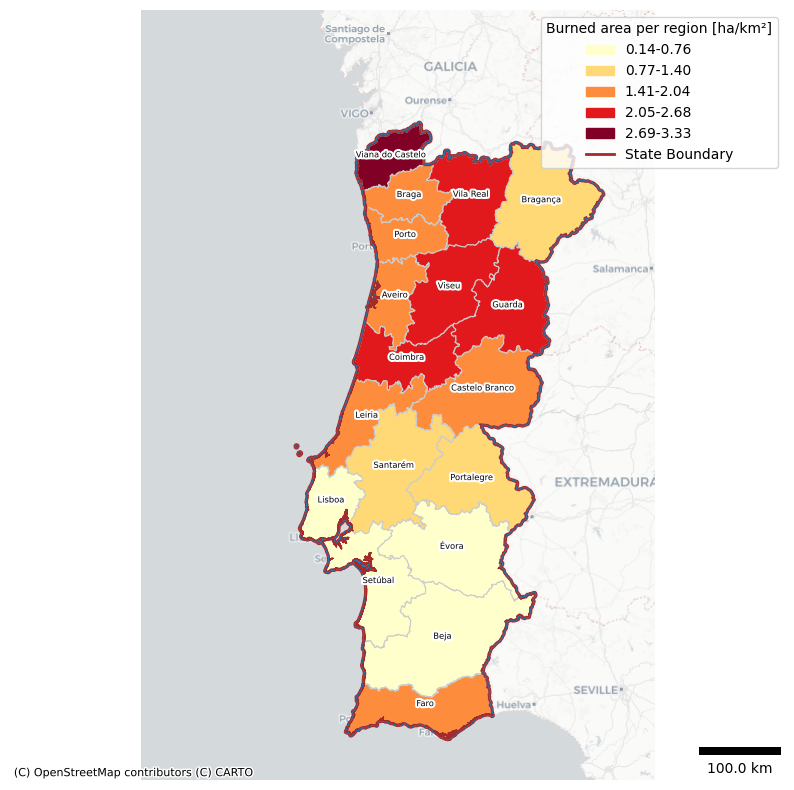

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar
scalebar = ScaleBar(1, location='lower right', units='m', scale_loc='bottom', length_fraction=0.25, scale_formatter=lambda value, unit: f'{value/1000} km', fixed_value=100000)
ax.add_artist(scalebar)

plt.axis("equal")
ax.set_axis_off()
plt.show()


**I do not want a decimal in the scale value** work scale

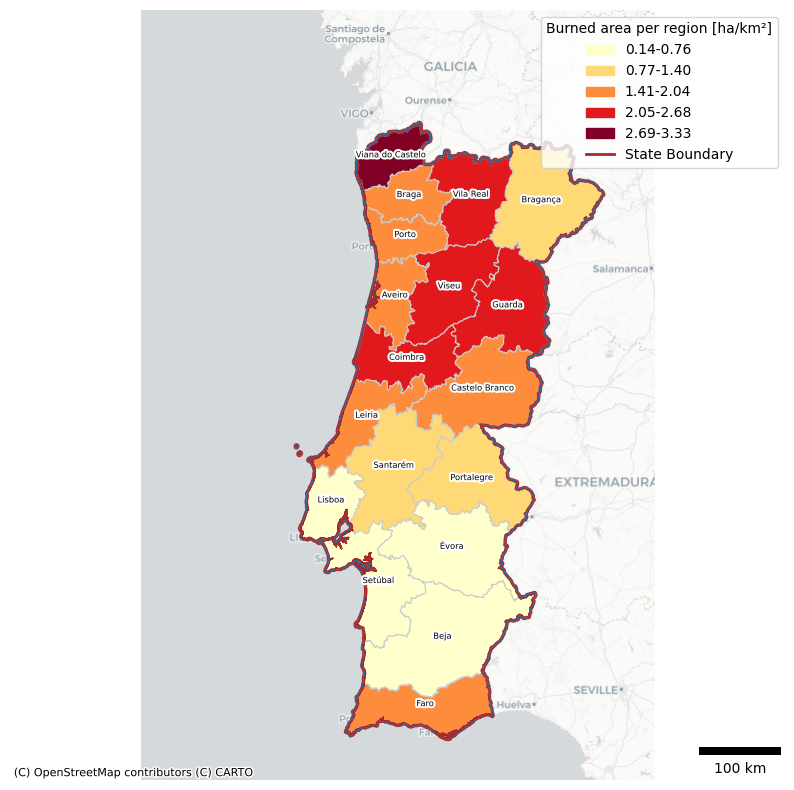

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',  # Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)

plt.axis("equal")
ax.set_axis_off()
plt.show()


**change the previous scale color to gray** work scale

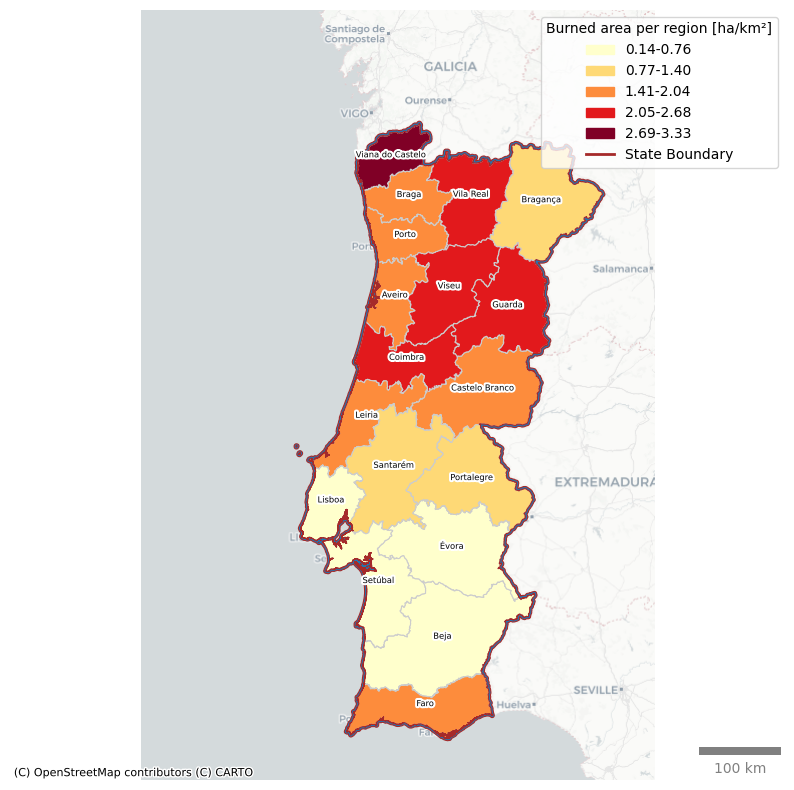

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)

plt.axis("equal")
ax.set_axis_off()
plt.show()


**can you add a credit containing data source:, the author's name, place and year that the map was created? Here is the credit "Author: Parinda Pannoon Date: 12/03/2024 Spatial Reference: EPSG:3857 Data source: Global Wildfire Information System (GWIS)"-placed below the map properly by not overlapping other elements -less dominant in size and color. Ask me 3 additional questions**

1.Credit Line Alignment: Where specifically would you like the credit line to be aligned relative to the map's frame? Common choices include centered below the map, aligned to the left, or aligned to the right.

2.Credit Line Color: You mentioned a preference for the credit line to be "less dominant in size and color." Could you specify a color you'd prefer for the text, given the background it will be placed on? For instance, a light gray might be less dominant.

3.Font Size for Credit Line: What font size do you envision for the credit line to ensure it's readable yet not overly prominent? A smaller font size than the main text but still legible would likely be appropriate.

1. at the left below the map frame. 2. light grey color. 3.A smaller font size than the main text but still legible would likely be appropriate.

work credits

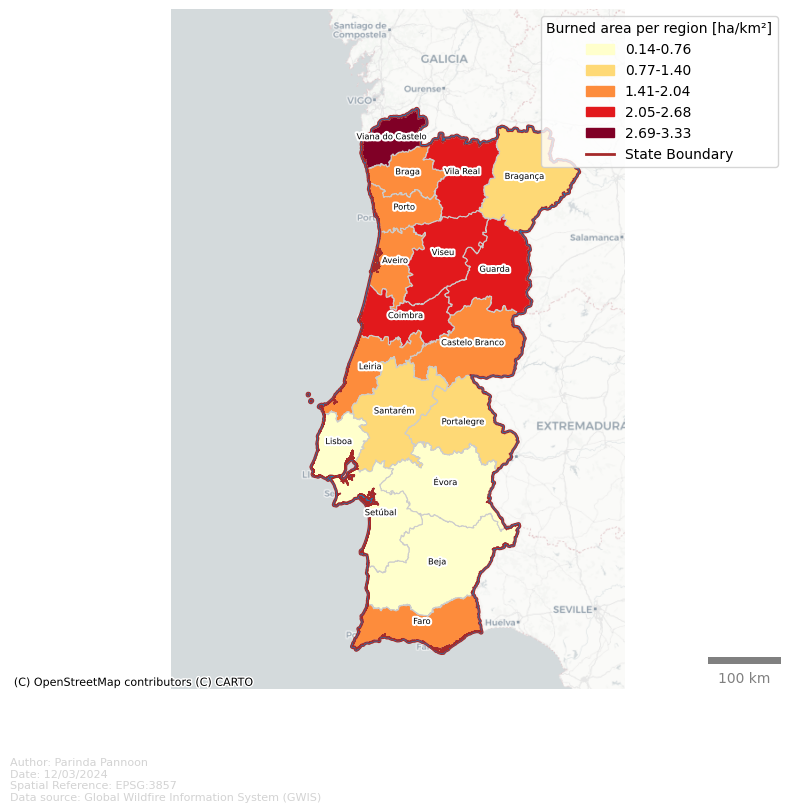

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)

plt.axis("equal")
ax.set_axis_off()
plt.show()


**I need you to add a subtitle below the main title describing "Mainland of Portugal, 2002-2022" and change the main title to "AVERAGE BURNED AREA PER REGION AREA". And the sub-title should be smaller and not so dominant as the main title. Ask me 3 additional questions**

1.Subtitle Alignment: Would you like the subtitle ("Mainland of Portugal, 2002-2022") to be centered directly under the main title, aligned to the left, or aligned to the right?

2.Subtitle Color: To ensure the subtitle is less dominant than the main title, do you have a preference for its color? Would you prefer a standard color like black but with reduced opacity, or a different color that complements the map's color scheme?

3.Distance Between Main Title and Subtitle: How much space do you prefer between the main title and the subtitle? This could be a small gap to keep them visually connected or a larger gap to distinguish them more clearly.

1. the subtitle ("Mainland of Portugal, 2002-2022") to be centered directly under the main title 2. black color. 3.a small gap to keep them visually connected

failed subtitle [title/subtitle]

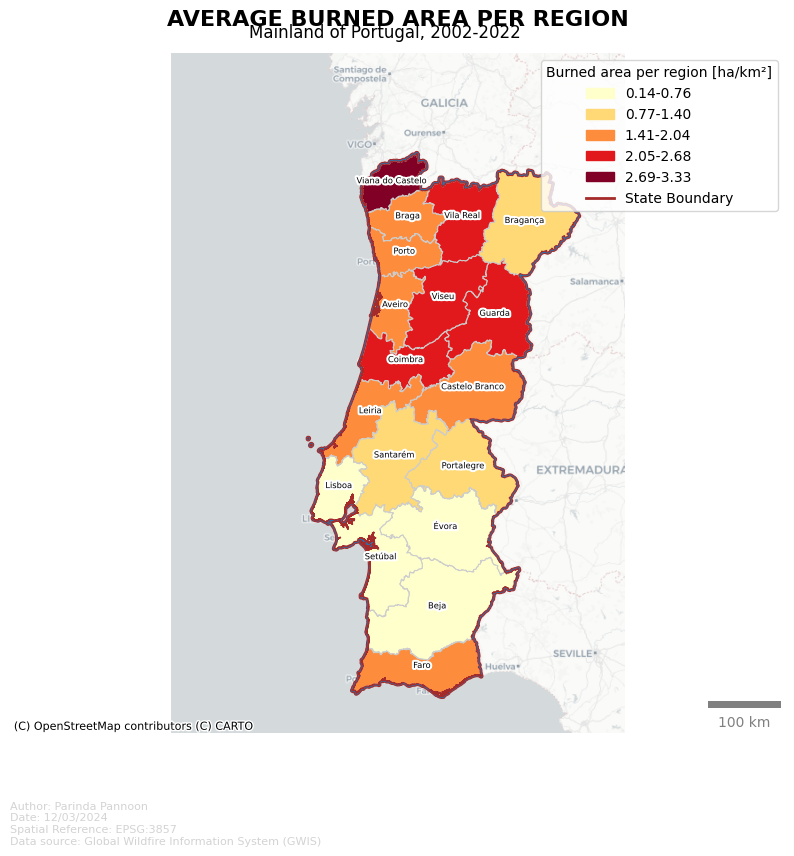

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with larger font size and bold font weight
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', pad=20)

# Add subtitle directly below the main title
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', y=0.91)

plt.axis("equal")
ax.set_axis_off()
plt.show()


**I prefer both map title and subtitle use Serif font and increase the gap between the sub title and the main title a bit** failed subtitle

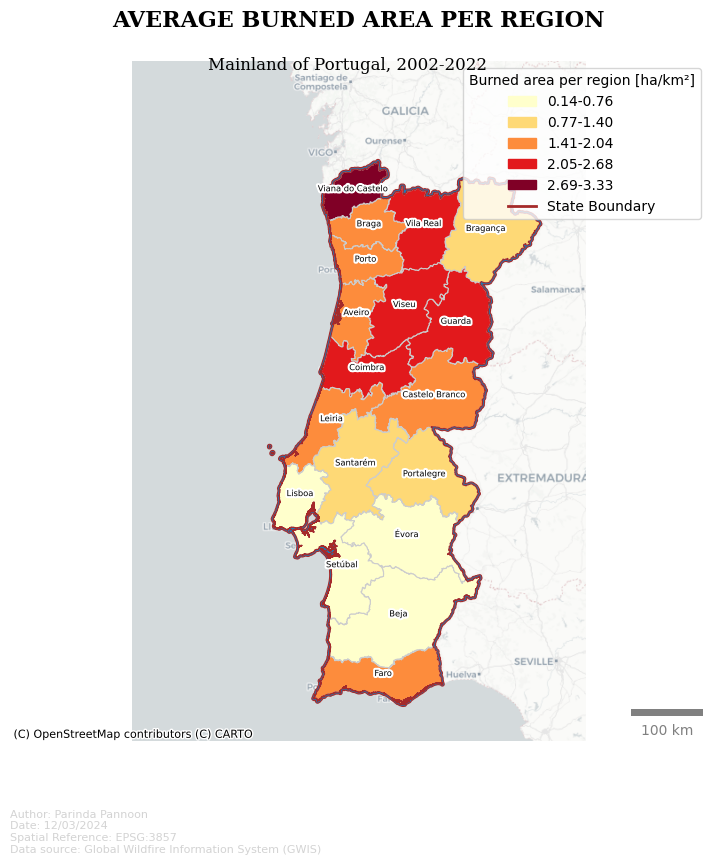

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)

plt.axis("equal")
ax.set_axis_off()
plt.show()


**Can you add a data visualization from this CSV file to show "Average burned area yearly " and give me an updated code? The data will be shown as a vertical bar chart placed beside the map. Ask me 3 additional questions**

1.CSV File Structure: Could you describe the structure of the CSV file, particularly the columns you have? I'm interested in the names of the columns for the years and the average burned areas.

2.Bar Chart Dimensions and Placement: Considering the bar chart will be placed beside the map, what dimensions do you envision for the chart, and how close should it be to the map? This will help determine the overall layout and ensure both elements are balanced and clearly visible.

3.Visual Style of the Bar Chart: Do you have any preferences for the color scheme or style of the bar chart? This could involve specific colors for the bars, whether each year should have a different color, or if there's a thematic color scheme that should align with the map's presentation.

1. "Year" as x axis, "Burned Area [ha]" as y-axis, 2.the chart will be at the upper left inside the map frame. 3. the chart color is #E1C461 and all axes and labels should be grey and small.

failed datavis

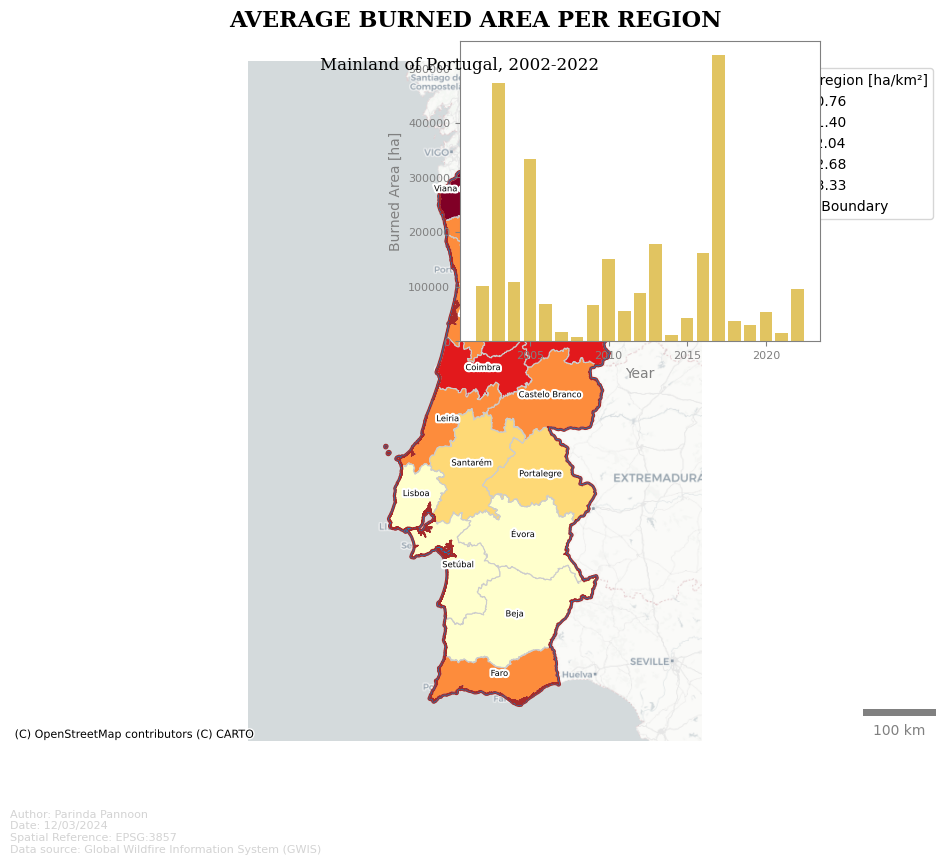

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(12, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Position for the inset axis, [left, bottom, width, height] in figure coordinate
inset_ax = fig.add_axes([0.5, 0.6, 0.3, 0.3])  # Adjust as necessary for placement inside the map frame

# Plotting the bar chart on the inset axis
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customizing the bar chart appearance
inset_ax.set_xlabel('Year', fontsize=10, color='grey')
inset_ax.set_ylabel('Burned Area [ha]', fontsize=10, color='grey')
inset_ax.tick_params(axis='x', colors='grey', labelsize=8)
inset_ax.tick_params(axis='y', colors='grey', labelsize=8)
inset_ax.spines['top'].set_color('grey')
inset_ax.spines['right'].set_color('grey')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')

# Ensure the main map plotting does not interfere with the inset
ax.set_axis_off()


plt.show()


**I need you to move the chart to the upper left of the map. Ask me 3 additional questions**

1.Map and Chart Alignment: Considering the shift of the chart to the upper left outside the map frame, how should the top of the chart align with the map? Should it align with the top of the map, or is there a preference for it to be slightly lower or higher than the map's top edge?

2.Spacing Between Map and Chart: What is your preferred spacing between the map and the chart? This spacing is crucial to avoid crowding and ensure that both elements are distinct yet part of the same visual presentation.

3.Chart Dimensions Relative to Map: Given the new placement, do you have any specific dimensions in mind for the chart compared to the map's size? For example, should the chart occupy a certain percentage of the map's width and height?

1. I need the chart to be slightly lower than the map's top edge. 2. do not overlap the chart and map 3. also reduce the chart size to be smaller.

failed map/chart

<ipython-input-60-3773d4406af2>:31: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax_map = plt.subplot(121)  # Use half of the figure for the map


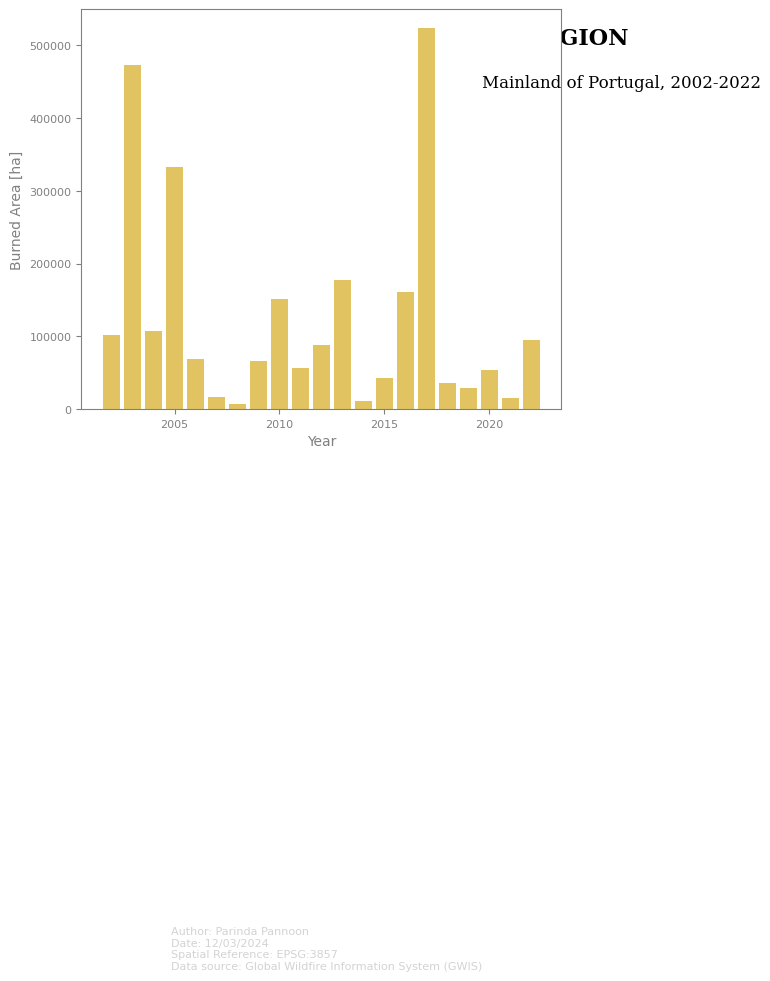

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(12, 10))
# Main map plot
ax_map = plt.subplot(121)  # Use half of the figure for the map
# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax_map.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Plot the bar chart
# Adding the bar chart in a smaller, non-overlapping position
ax_chart = plt.subplot(222)  # This positions the chart in the upper left quadrant of the figure
ax_chart.set_position([0.05, 0.55, 0.4, 0.4])  # Adjust these values as needed: [left, bottom, width, height]

ax_chart.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart appearance
ax_chart.set_xlabel('Year', fontsize=10, color='grey')
ax_chart.set_ylabel('Burned Area [ha]', fontsize=10, color='grey')
ax_chart.tick_params(axis='both', colors='grey', labelsize=8)
ax_chart.spines['top'].set_color('grey')
ax_chart.spines['right'].set_color('grey')
ax_chart.spines['bottom'].set_color('grey')
ax_chart.spines['left'].set_color('grey')

# Ensure the main map plotting does not interfere with the inset
ax_map.set_axis_off()


plt.show()


# **Prompt pattern: Question refinement**

**From now on, whenever I tell you to do a task about adjusting the map, suggest a better version to use that incorporates information specific to map creation.**

**Task: From the following code, can you reduce the bar chart width and place it at the upper left of the map frame ? suggest a better version of the prompt...**

Refined Task Description:

Incorporate a bar chart displaying "Average Burned Area Yearly" based on CSV data into a geographical map visualization. The bar chart should be positioned in the upper left corner of the map frame to provide a comprehensive overview without overcrowding. Key adjustments include optimizing the bar chart's width for readability, ensuring its placement complements the map's spatial data without obscuring key details, and harmonizing the design elements (color, font size) to maintain a cohesive visual narrative.

failed datavis

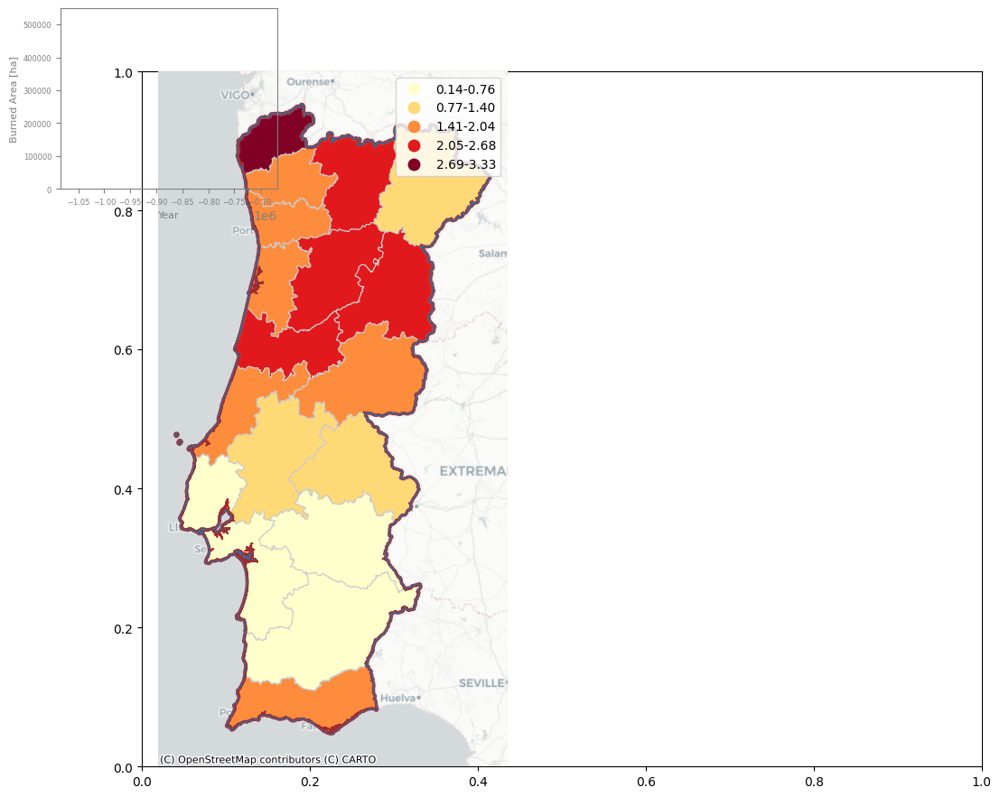

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal

# Load CSV data for the yearly average burned area
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'
data = pd.read_csv(csv_file_path)

# Assuming 'mainlandburn_gdf' and 'boundary_gdf' are loaded and correctly projected (EPSG:3857)
# No need to reload here; assuming these are pre-loaded

# Prepare the figure and grid layout
fig, ax = plt.subplots(figsize=(12, 10))
gs = fig.add_gridspec(2, 2)

# Map on the left, spanning both rows
ax_map = fig.add_subplot(gs[:, 0])

# Bar chart in the upper left corner of the map frame
ax_chart = fig.add_subplot(gs[0, 0], sharex=ax_map)

# Plotting the map
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax_map, edgecolor='0.8', legend=True, categorical=True)
boundary_gdf.plot(ax=ax_map, color=None, edgecolor='brown', linewidth=0.8)

# Customize the map's appearance
ctx.add_basemap(ax_map, source=ctx.providers.CartoDB.Positron)
ax_map.set_axis_off()

# Plotting the bar chart on the inset axis
ax_chart.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461', width=0.4)  # Adjusted bar width for readability

# Customize the bar chart's appearance and position
ax_chart.set_position([0.05, 0.75, 0.2, 0.2])  # Adjust positioning inside the map frame
ax_chart.set_xlabel('Year', fontsize=8, color='grey')
ax_chart.set_ylabel('Burned Area [ha]', fontsize=8, color='grey')
ax_chart.tick_params(axis='x', colors='grey', labelsize=6)
ax_chart.tick_params(axis='y', colors='grey', labelsize=6)
ax_chart.spines['top'].set_color('grey')
ax_chart.spines['right'].set_color('grey')
ax_chart.spines['bottom'].set_color('grey')
ax_chart.spines['left'].set_color('grey')
ax_chart.set_facecolor('none')  # Make the background transparent

# Add supplementary map elements like scale bar, credits as needed, adjusting for the new layout

plt.show()


**The chart does not appear on the map. give me completed code and suggest a better prompt**

Suggested Better Prompt:

"Enhance the visualization of Portugal's wildfire data by embedding a yearly average burned area bar chart within a comprehensive map. The map should vividly depict regional variations in burned areas, with the bar chart offering a temporal perspective directly on the visualization. This integration will provide an immediate, clear understanding of both spatial distribution and temporal trends, leveraging design and layout optimizations to ensure both components are harmoniously combined and equally informative."

work datavis/map

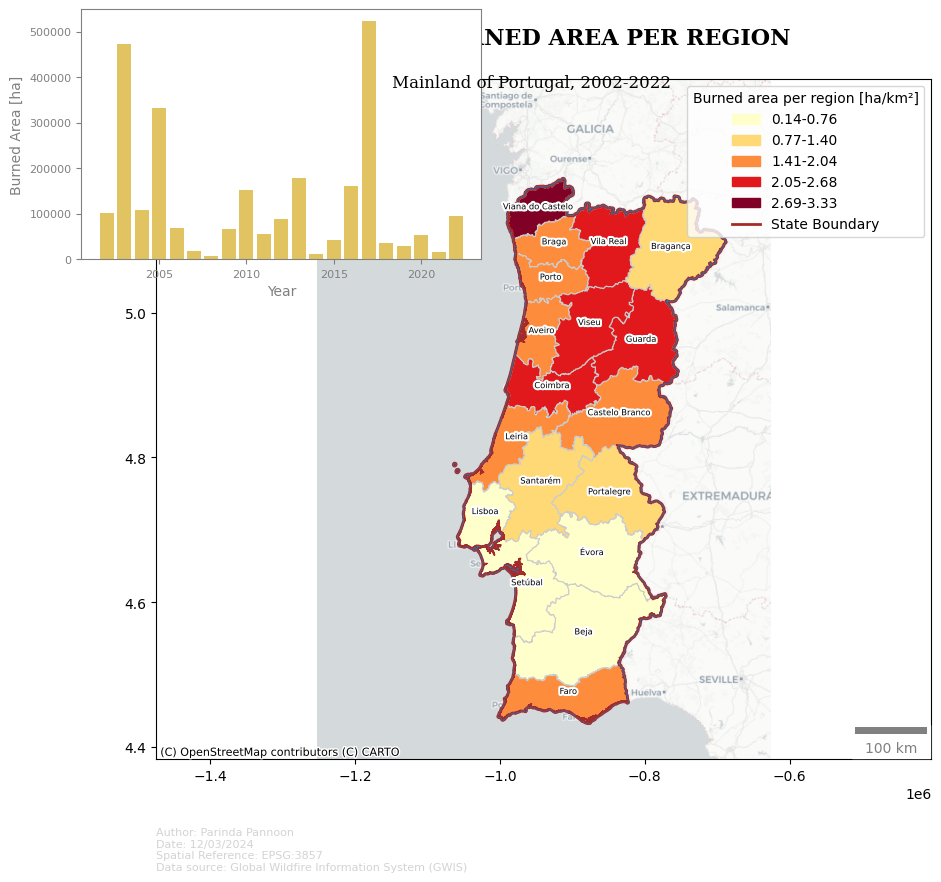

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Position for the inset axis, [left, bottom, width, height] in figure coordinate
inset_ax = fig.add_axes([0.05, 0.7, 0.4, 0.25])  # Adjust as necessary for placement inside the map frame

# Plot the bar chart in the inset axis
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart appearance
inset_ax.set_xlabel('Year', fontsize=10, color='grey')
inset_ax.set_ylabel('Burned Area [ha]', fontsize=10, color='grey')
inset_ax.tick_params(axis='x', colors='grey', labelsize=8)
inset_ax.tick_params(axis='y', colors='grey', labelsize=8)
inset_ax.spines['top'].set_color('grey')
inset_ax.spines['right'].set_color('grey')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')


plt.show()


**Can you reduce the bar chart height and reduce the font size of the chart labels on both axes? Suggest a better version of prompt**

Suggested Refined Prompt:

"Optimize the integration of a yearly average burned area bar chart within the main map visualization to ensure clarity and visual harmony. This involves refining the bar chart's proportions and the readability of its labels. Adjustments should focus on resizing the chart for a less obtrusive presence and fine-tuning text elements to enhance legibility while maintaining the overall aesthetic balance between the chart and the map. This approach aims to present a cohesive overview of Portugal's wildfire data, combining spatial and temporal insights effectively."

failed datavis

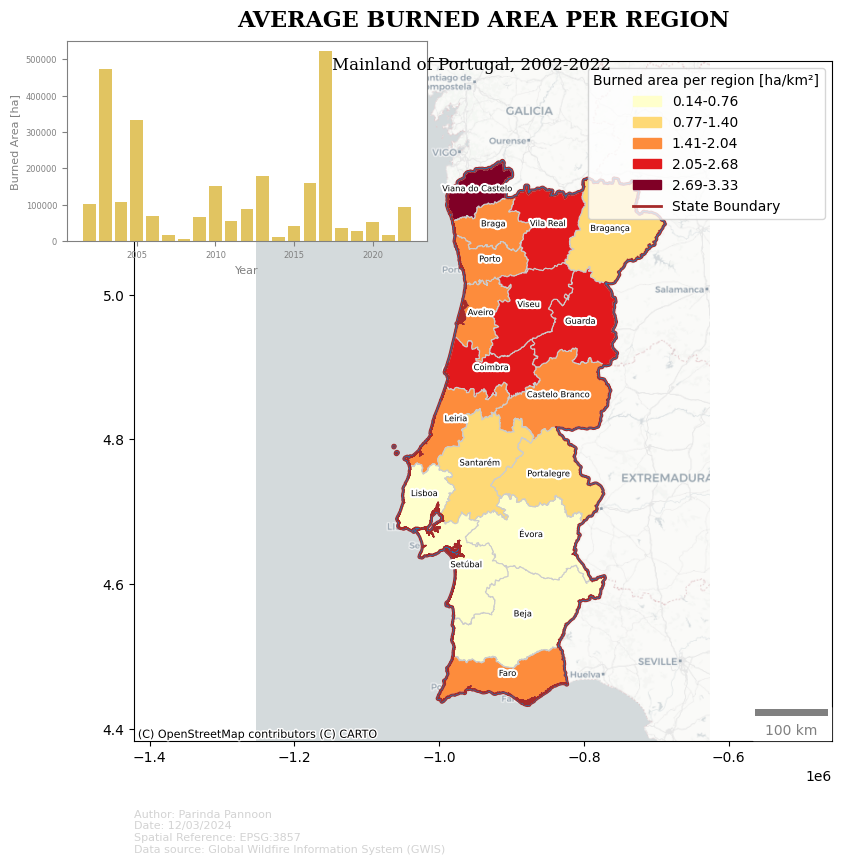

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Adjust the inset axis dimensions to reduce the bar chart height
inset_ax = fig.add_axes([0.05, 0.7, 0.4, 0.2])  # Adjust height parameter to reduce chart height

# Plot the bar chart in the adjusted inset axis
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart appearance with reduced font sizes for a more integrated look
inset_ax.set_xlabel('Year', fontsize=8, color='grey')  # Reduced font size for the X-axis label
inset_ax.set_ylabel('Burned Area [ha]', fontsize=8, color='grey')  # Reduced font size for the Y-axis label
inset_ax.tick_params(axis='x', colors='grey', labelsize=6)  # Reduced font size for X-axis ticks
inset_ax.tick_params(axis='y', colors='grey', labelsize=6)  # Reduced font size for Y-axis ticks
inset_ax.spines['top'].set_color('grey')
inset_ax.spines['right'].set_color('grey')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')


plt.show()


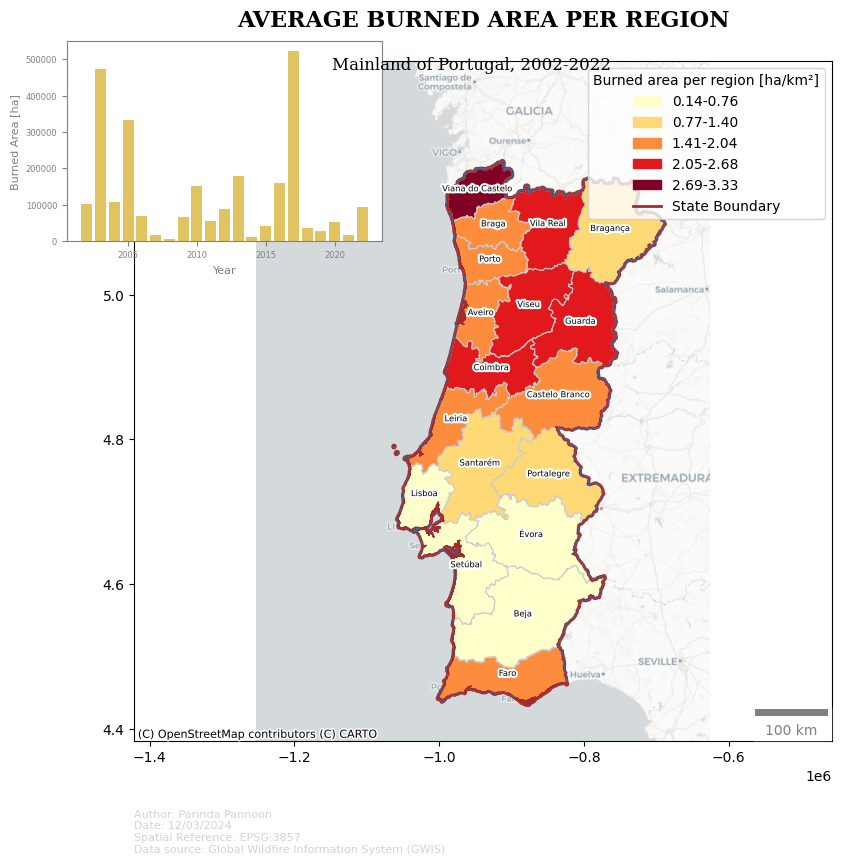

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Adjust the inset axis dimensions to reduce the bar chart height
inset_ax = fig.add_axes([0.05, 0.7, 0.35, 0.2])  # Adjust height parameter to reduce chart height

# Plot the bar chart in the adjusted inset axis
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart appearance with reduced font sizes for a more integrated look
inset_ax.set_xlabel('Year', fontsize=8, color='grey')  # Reduced font size for the X-axis label
inset_ax.set_ylabel('Burned Area [ha]', fontsize=8, color='grey')  # Reduced font size for the Y-axis label
inset_ax.tick_params(axis='x', colors='grey', labelsize=6)  # Reduced font size for X-axis ticks
inset_ax.tick_params(axis='y', colors='grey', labelsize=6)  # Reduced font size for Y-axis ticks
inset_ax.spines['top'].set_color('grey')
inset_ax.spines['right'].set_color('grey')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')


plt.show()


**From this code, can you remove a chart background and reduce the chart width. Suggest a better version of the prompt.**

Refined Task Description:

Streamline the addition of a "Yearly Average Burned Area" bar chart to your geographical map of Portugal. Focus on minimizing the chart's spatial footprint and maximizing its informational value. Achieve a clear, unobstructed view of both the map and the chart by strategically resizing and repositioning the chart. Ensure the chart's background seamlessly integrates with the map, enhancing the overall presentation.

work datavis

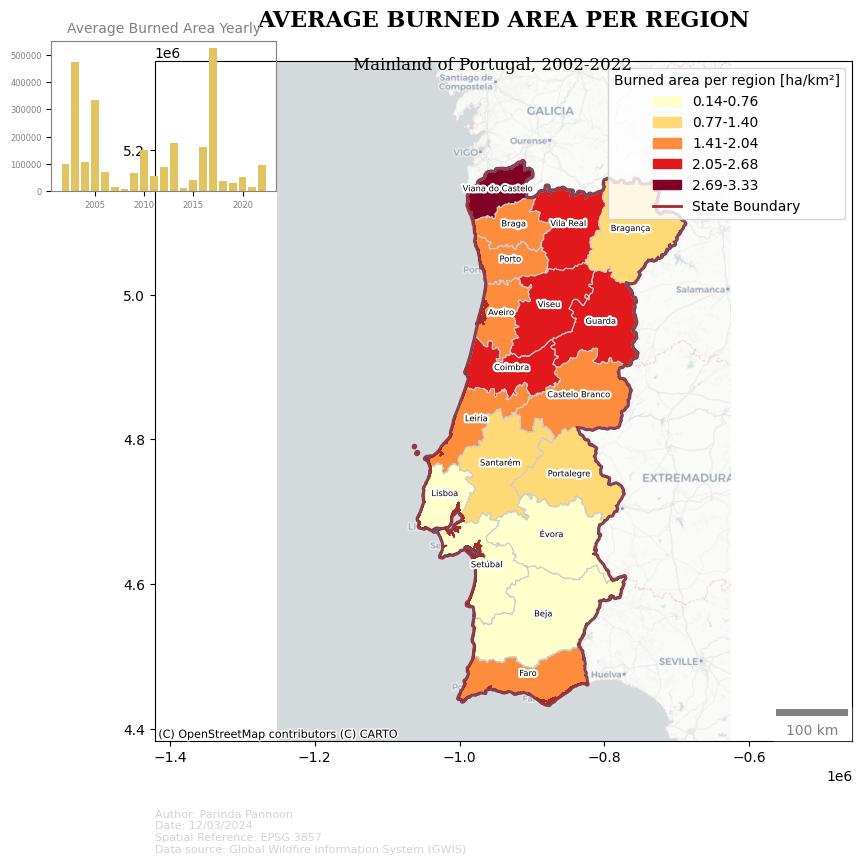

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")


# Insert a refined bar chart
inset_ax = fig.add_axes([0.01, 0.75, 0.25, 0.15])  # Adjusted for a smaller width and transparent background
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')
inset_ax.set_facecolor('none')  # Removes background
inset_ax.set_title("Average Burned Area Yearly", fontsize=10, color='grey')
inset_ax.tick_params(axis='x', labelsize=6, labelcolor='grey')
inset_ax.tick_params(axis='y', labelsize=6, labelcolor='grey')
inset_ax.spines['top'].set_color('grey')
inset_ax.spines['right'].set_color('grey')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')


plt.show()


**move the chart inside the map at the upper left and move the legend to the lower right of the map but above the scale bar's position. Suggest a better version of the prompt.**

Refined Task Description:

Embed a "Yearly Average Burned Area" bar chart within the upper left quadrant of a choropleth map detailing wildfire impacts across Portugal. This strategic placement allows for an intuitive visual correlation between spatial and temporal analyses. Simultaneously, reposition the legend to the lower right area of the map, ensuring it does not obscure the scale bar or essential map details. This layout adjustment should prioritize a balanced and informative visual narrative, facilitating an immediate understanding of the data's spatial and temporal dimensions.

failed datavis/legend

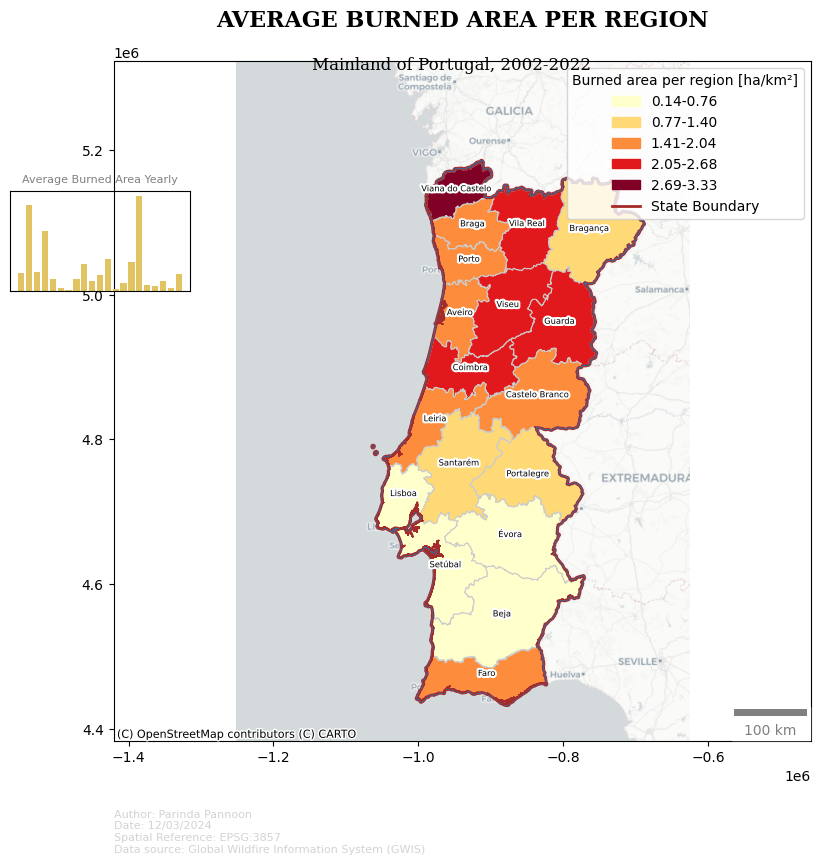

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")


# Insert a bar chart inside the map at the upper left
inset_ax = fig.add_axes([0.01, 0.65, 0.2, 0.1])  # Adjusted position and size
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')
inset_ax.set_facecolor('none')  # Remove background
inset_ax.set_title("Average Burned Area Yearly", fontsize=8, color='grey')
inset_ax.tick_params(axis='both', which='both', length=0)  # Remove ticks
inset_ax.set_xticks([])
inset_ax.set_yticks([])

plt.show()


**move the chart to be inside the map frame. Suggest a better version of prompt**

failed datavis

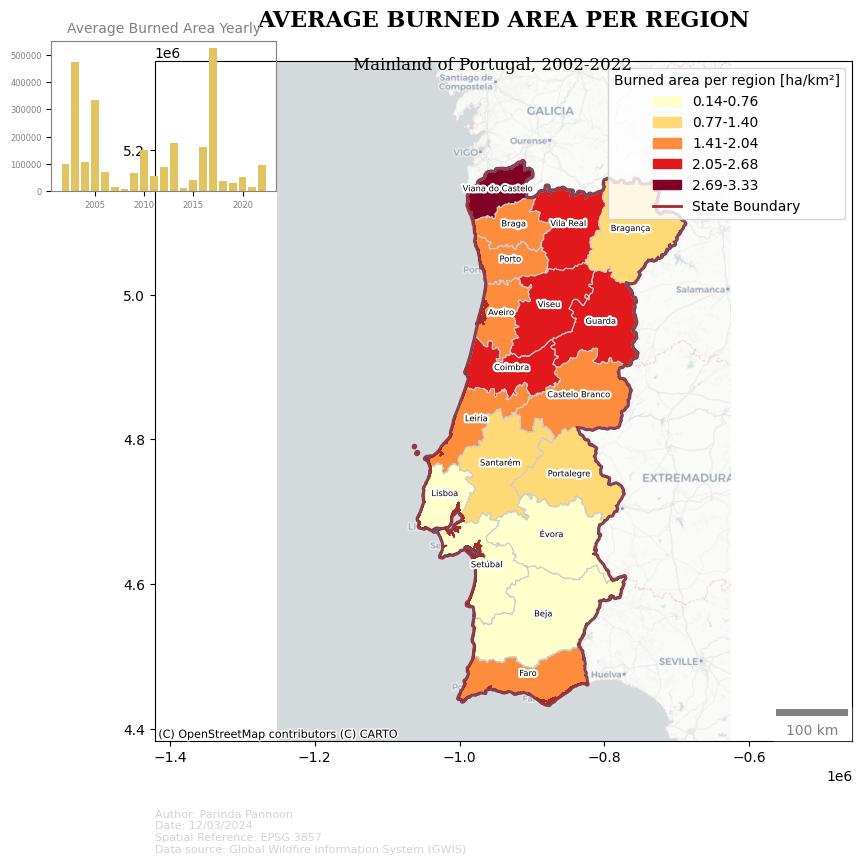

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='upper right', title='Legend')
leg = ax.get_legend()
leg.set_bbox_to_anchor((1, 1))
leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")


# Insert a refined bar chart
inset_ax = fig.add_axes([0.01, 0.75, 0.25, 0.15])  # Adjusted for a smaller width and transparent background
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')
inset_ax.set_facecolor('none')  # Removes background
inset_ax.set_title("Average Burned Area Yearly", fontsize=10, color='grey')
inset_ax.tick_params(axis='x', labelsize=6, labelcolor='grey')
inset_ax.tick_params(axis='y', labelsize=6, labelcolor='grey')
inset_ax.spines['top'].set_color('grey')
inset_ax.spines['right'].set_color('grey')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')


plt.show()


<ipython-input-95-2a3576b8ae2d>:107: UserWarning: FixedFormatter should only be used together with FixedLocator
  inset_ax.set_xticklabels(data['Year'], rotation=45, fontsize=8)


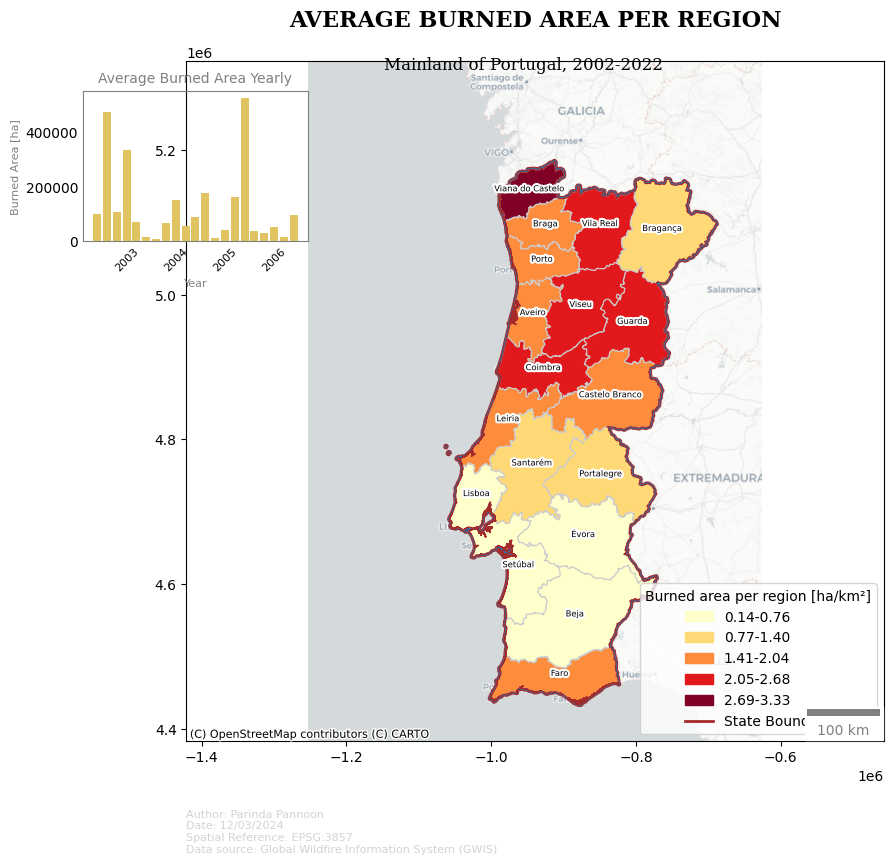

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='lower right', title='Legend')
leg = ax.get_legend()

leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Insert a bar chart within the map frame, at a location that ensures readability
inset_ax = fig.add_axes([0.01, 0.7, 0.25, 0.15])  # Adjusted position within map frame
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')
inset_ax.set_facecolor('none')
inset_ax.set_xlabel('Year', fontsize=8, color='grey')  # Reduced font size for the X-axis label
inset_ax.set_ylabel('Burned Area [ha]', fontsize=8, color='grey')  # Reduced font size for the Y-axis label
inset_ax.set_title("Average Burned Area Yearly", fontsize=10, color='grey', backgroundcolor='none')
inset_ax.spines['top'].set_color('grey')
inset_ax.spines['right'].set_color('grey')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')
inset_ax.tick_params(axis='both', which='both', size=0)  # Simplify by removing ticks
inset_ax.set_xticklabels(data['Year'], rotation=45, fontsize=8)
plt.show()


**add axis ticks and axis labels in grey color** work datavis

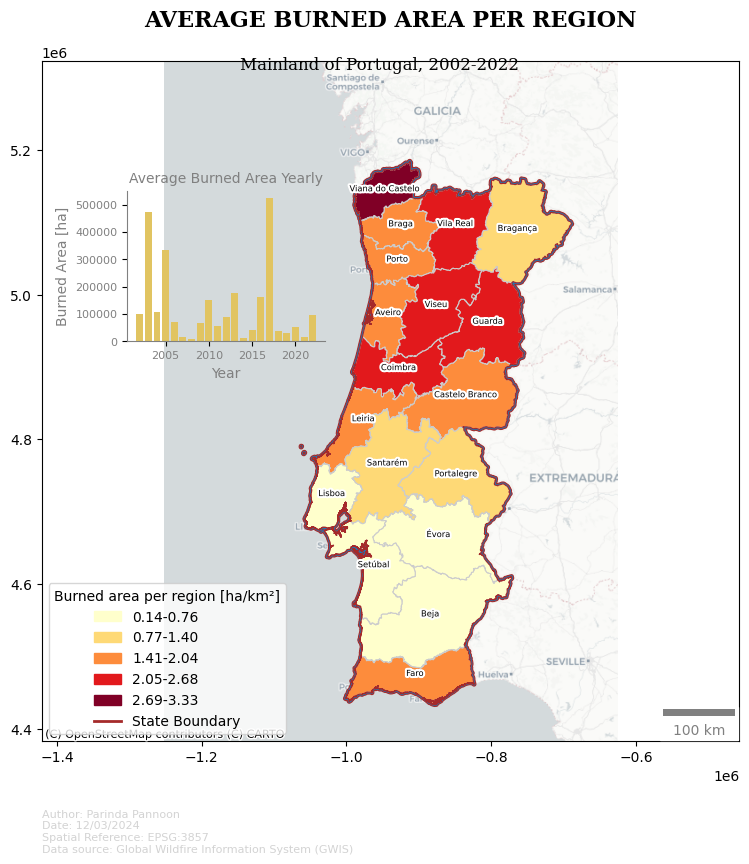

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))

# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='lower left', title='Legend')
leg = ax.get_legend()

leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Define the position for the embedded bar chart within the map frame
inset_ax = fig.add_axes([0.22, 0.6, 0.22, 0.15])  # [left, bottom, width, height] relative to the figure

# Plot the bar chart inside the map frame
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart to integrate seamlessly
inset_ax.set_title("Average Burned Area Yearly", fontsize=10, color='grey', backgroundcolor='none')
inset_ax.set_xlabel('Year', color='grey', fontsize=10)
inset_ax.set_ylabel('Burned Area [ha]', color='grey', fontsize=10)
inset_ax.tick_params(axis='x', labelsize=8, labelcolor='grey')
inset_ax.tick_params(axis='y', labelsize=8, labelcolor='grey')
inset_ax.spines['top'].set_color('none')
inset_ax.spines['right'].set_color('none')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')
inset_ax.set_facecolor('none')  # Optional: make the background transparent

plt.show()


**can you add a background color filled within the map frame and remove the map axis ticks? Suggest a better version of prompt.**

Refined Task Description:

Integrate a bar chart depicting "Yearly Average Burned Area" into the geographic map's frame, creating a unified visual field that combines spatial and temporal data. Apply a subtle background color within the map frame to augment visual distinction and focus, while removing axis ticks to maintain a clean and uncluttered appearance. This harmonious blend of elements should not only facilitate an immediate grasp of the data's dimensions but also elevate the overall aesthetic quality of the presentation.

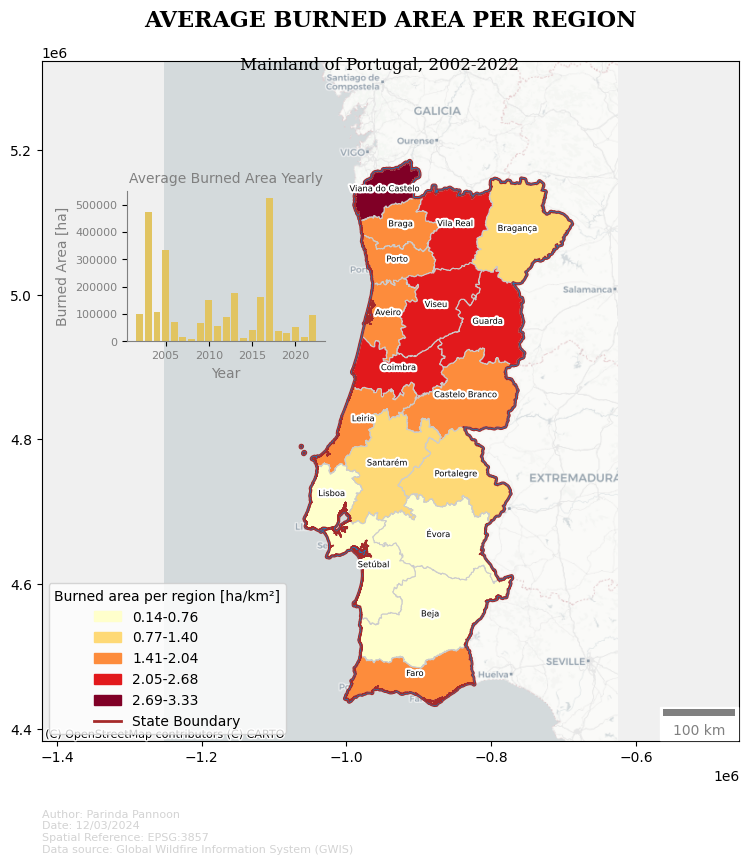

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))
ax.set_facecolor('#f0f0f0')
# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='lower left', title='Legend')
leg = ax.get_legend()

leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 12/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.1, credit_text, color='lightgrey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Define the position for the embedded bar chart within the map frame
inset_ax = fig.add_axes([0.22, 0.6, 0.22, 0.15])  # [left, bottom, width, height] relative to the figure

# Plot the bar chart inside the map frame
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart to integrate seamlessly
inset_ax.set_title("Average Burned Area Yearly", fontsize=10, color='grey', backgroundcolor='none')
inset_ax.set_xlabel('Year', color='grey', fontsize=10)
inset_ax.set_ylabel('Burned Area [ha]', color='grey', fontsize=10)
inset_ax.tick_params(axis='x', labelsize=8, labelcolor='grey')
inset_ax.tick_params(axis='y', labelsize=8, labelcolor='grey')
inset_ax.spines['top'].set_color('none')
inset_ax.spines['right'].set_color('none')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')
inset_ax.set_facecolor('none')  # Optional: make the background transparent

plt.show()


**It removes the frame instead of only the axis ticks. Can you remove only the ticks?. Suggest a better version of prompt.**

Refined Task Description:

Modify the geographic map visualization to remove only the axis ticks, preserving the map frame for a cleaner and more focused display. This adjustment aims to streamline the visual interface, emphasizing the spatial data without the clutter of axis ticks. Additionally, integrate a bar chart within the map's frame to offer temporal insights, further enriching the map's informational depth. Apply design choices that balance information density with visual simplicity, fostering an intuitive and engaging user experience.

work

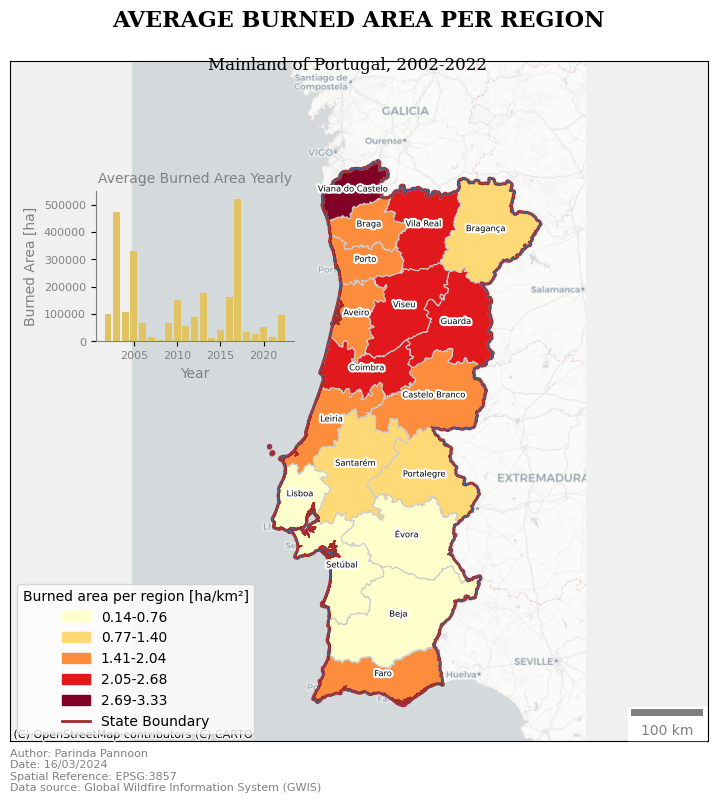

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))
ax.set_facecolor('#f0f0f0')
# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)


# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='lower left', title='Legend')
leg = ax.get_legend()

leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 16/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.01, credit_text, color='grey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Define the position for the embedded bar chart within the map frame
inset_ax = fig.add_axes([0.22, 0.6, 0.22, 0.15])  # [left, bottom, width, height] relative to the figure

# Plot the bar chart inside the map frame
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart to integrate seamlessly
inset_ax.set_title("Average Burned Area Yearly", fontsize=10, color='grey', backgroundcolor='none')
inset_ax.set_xlabel('Year', color='grey', fontsize=10)
inset_ax.set_ylabel('Burned Area [ha]', color='grey', fontsize=10)
inset_ax.tick_params(axis='x', labelsize=8, labelcolor='grey')
inset_ax.tick_params(axis='y', labelsize=8, labelcolor='grey')
inset_ax.spines['top'].set_color('none')
inset_ax.spines['right'].set_color('none')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')
inset_ax.set_facecolor('none')  # Optional: make the background transparent

plt.show()


**can you change the map frame's color to dark red? Suggest a better version of prompt.**

work

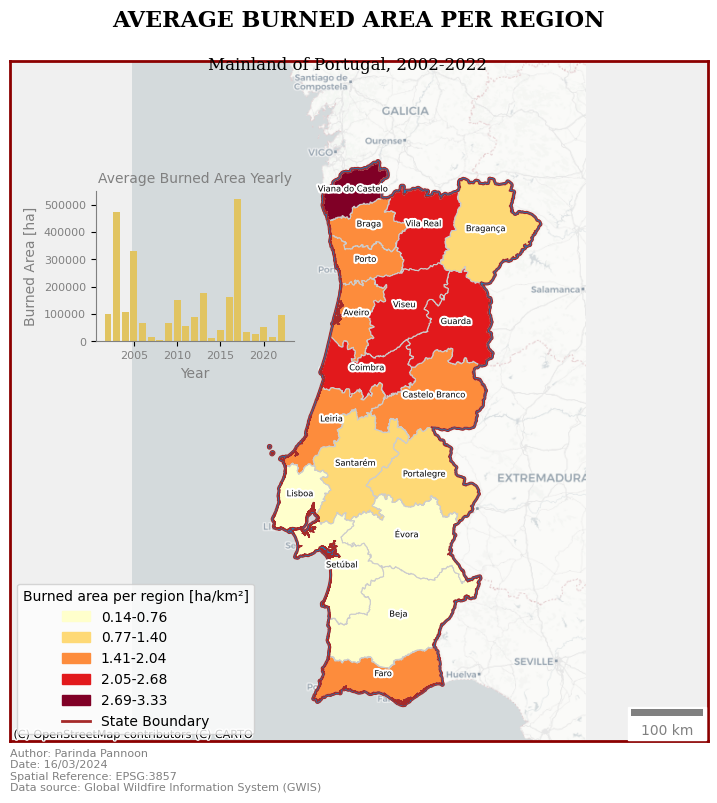

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))
ax.set_facecolor('#f0f0f0')
# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
# Change map frame's color to dark red
for spine in ax.spines.values():
    spine.set_edgecolor('darkred')
    spine.set_linewidth(2)

# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='lower left', title='Legend')
leg = ax.get_legend()

leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 16/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.01, credit_text, color='grey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.885)
plt.axis("equal")

# Define the position for the embedded bar chart within the map frame
inset_ax = fig.add_axes([0.22, 0.6, 0.22, 0.15])  # [left, bottom, width, height] relative to the figure

# Plot the bar chart inside the map frame
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart to integrate seamlessly
inset_ax.set_title("Average Burned Area Yearly", fontsize=10, color='grey', backgroundcolor='none')
inset_ax.set_xlabel('Year', color='grey', fontsize=10)
inset_ax.set_ylabel('Burned Area [ha]', color='grey', fontsize=10)
inset_ax.tick_params(axis='x', labelsize=8, labelcolor='grey')
inset_ax.tick_params(axis='y', labelsize=8, labelcolor='grey')
inset_ax.spines['top'].set_color('none')
inset_ax.spines['right'].set_color('none')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')
inset_ax.set_facecolor('none')  # Optional: make the background transparent

plt.show()


**...From this code move the subtitle a bit upper close to the map title. Suggest a better version of prompt.** failed subtitle

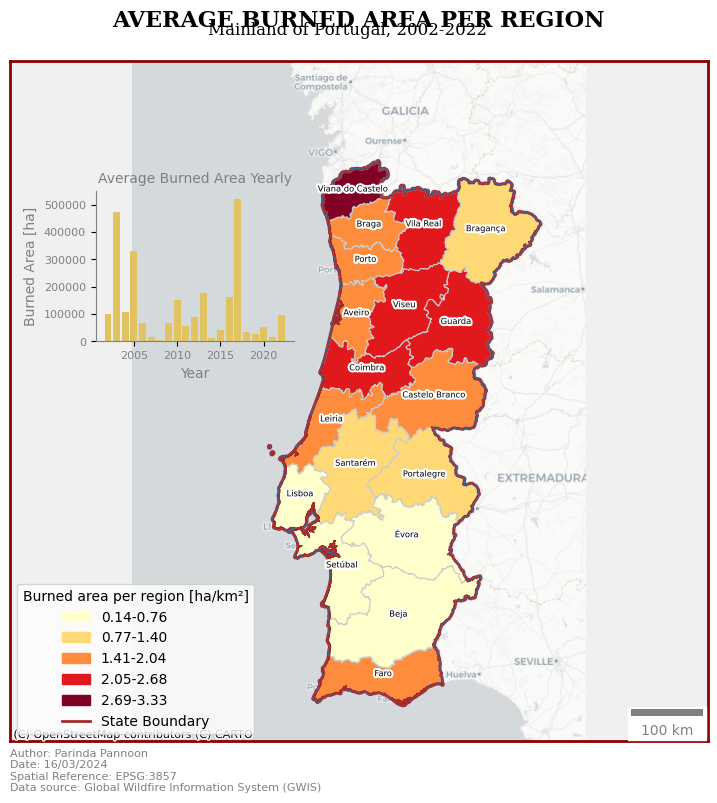

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10))
ax.set_facecolor('#f0f0f0')
# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
# Change map frame's color to dark red
for spine in ax.spines.values():
    spine.set_edgecolor('darkred')
    spine.set_linewidth(2)

# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='lower left', title='Legend')
leg = ax.get_legend()

leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 16/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.01, credit_text, color='grey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.92)
plt.axis("equal")

# Define the position for the embedded bar chart within the map frame
inset_ax = fig.add_axes([0.22, 0.6, 0.22, 0.15])  # [left, bottom, width, height] relative to the figure

# Plot the bar chart inside the map frame
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart to integrate seamlessly
inset_ax.set_title("Average Burned Area Yearly", fontsize=10, color='grey', backgroundcolor='none')
inset_ax.set_xlabel('Year', color='grey', fontsize=10)
inset_ax.set_ylabel('Burned Area [ha]', color='grey', fontsize=10)
inset_ax.tick_params(axis='x', labelsize=8, labelcolor='grey')
inset_ax.tick_params(axis='y', labelsize=8, labelcolor='grey')
inset_ax.spines['top'].set_color('none')
inset_ax.spines['right'].set_color('none')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')
inset_ax.set_facecolor('none')  # Optional: make the background transparent

plt.show()


**move the subtitle lower** work subtitle

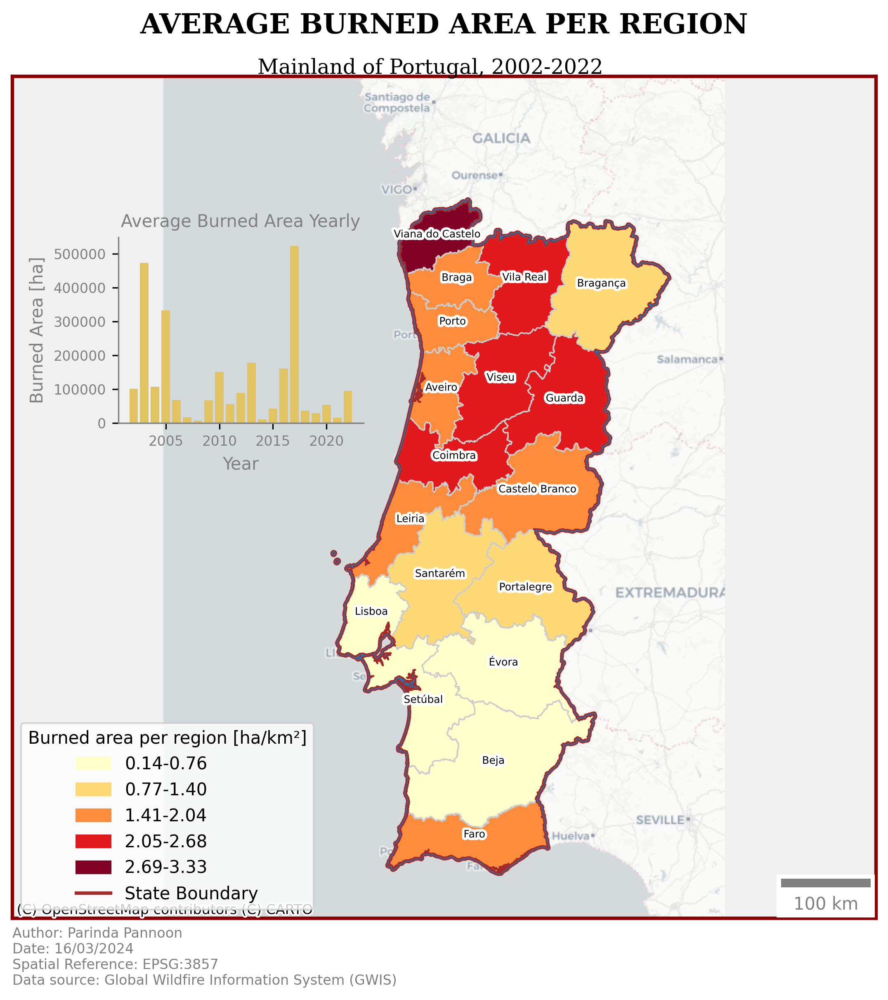

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patheffects import Stroke, Normal
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
from matplotlib_scalebar.scalebar import ScaleBar

# Load your CSV data
csv_file_path = '/content/MCD64.006.yearly-ba-nf.2002-2022.PRT_Portugal.csv'  # Update this to your CSV file path
data = pd.read_csv(csv_file_path)
# Assuming mainlandburn_gdf and boundary_gdf are already loaded and correctly projected to EPSG:3857
# # Load the mainlandburn shapefile (adjust the path as necessary)
mainlandburn_gdf = gpd.read_file('/content/mainlandburn.shp')
boundary_gdf = gpd.read_file('/content/boundary.shp')
# # Convert to Web Mercator projection used by most web maps (including CartoDB tiles)
mainlandburn_gdf = mainlandburn_gdf.to_crs(epsg=3857)
boundary_gdf = boundary_gdf.to_crs(epsg=3857)
# Adjust intervals for classification
min_value = mainlandburn_gdf['Burned_Are'].min()
max_value = 3.34  # Explicitly set the max value
interval_range = np.linspace(min_value, max_value, num=6)
interval_range[1:-1] = np.round(interval_range[1:-1] - 0.01, 2)

mainlandburn_gdf['class'] = pd.cut(mainlandburn_gdf['Burned_Are'], bins=interval_range, include_lowest=True, labels=[f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}" for i in range(len(interval_range)-1)])

# Plotting
fig, ax = plt.subplots(figsize=(9, 10), dpi=300)
ax.set_facecolor('#f0f0f0')
# Plot the choropleth map with discrete classes
mainlandburn_gdf.plot(column='class', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, categorical=True)

# Plot state boundaries
boundary_gdf.plot(ax=ax, color=None, edgecolor='brown', linewidth=0.8)

# Add CartoDB base map
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
# Change map frame's color to dark red
for spine in ax.spines.values():
    spine.set_edgecolor('darkred')
    spine.set_linewidth(2)

# Custom legend items for both burned area and state boundary# Create patches for the legend - these will represent the burned area classes
cmap = plt.get_cmap('YlOrRd')
colors = [cmap(i) for i in np.linspace(0, 1, 5)]
patches = [Patch(color=colors[i], label=f"{interval_range[i]:.2f}-{interval_range[i+1]-0.01:.2f}") for i in range(5)]
# Add a custom line for the state boundary legend
line = Line2D([0], [0], color='brown', linewidth=2, linestyle='-', label='State Boundary')

# Combine patches and line for the full legend
legend_elements = patches + [line]
# Customize legend for burned area
# Add custom legend to the map
ax.legend(handles=legend_elements, loc='lower left', title='Legend')
leg = ax.get_legend()

leg.set_title('Burned area per region [ha/km²]')


# Label each region with a white halo effect
for idx, row in mainlandburn_gdf.iterrows():
    plt.annotate(
        text=row['NAME_1'],  # Assuming 'NAME_1' is the column for region names
        xy=(row['geometry'].centroid.coords[0]),
        ha='center',
        fontsize=6,
        path_effects=[Stroke(linewidth=3, foreground='white'), Normal()]
    )

# Add a scale bar to the map
scalebar = ScaleBar(
    dx=1,  # One unit in the scale bar corresponds to 1 meter in reality
    location='lower right',  # Positioning the scale bar
    units='m',  # Units in meters
    scale_loc='bottom',
    color='gray',# Position of the scale division
    length_fraction=0.25,  # Length of the scale bar as a fraction of the axis
    scale_formatter=lambda value, _: f"{int(value / 1000)} km",  # Custom formatter to avoid decimals and show in km
    fixed_value=100000  # Fixed value representing 100 km
)

ax.add_artist(scalebar)
# Add credit text
credit_text = "Author: Parinda Pannoon\nDate: 16/03/2024\nSpatial Reference: EPSG:3857\nData source: Global Wildfire Information System (GWIS)"
plt.text(0, -0.01, credit_text, color='grey', fontsize=8, transform=ax.transAxes, ha='left', va='top', wrap=True)

# Adjustments to ensure everything fits properly
plt.subplots_adjust(bottom=0.2)
# Set main title with Serif font, larger font size, bold font weight, and adjust padding for more space
ax.set_title("AVERAGE BURNED AREA PER REGION", fontsize=16, fontweight='bold', fontname='Serif', pad=25)

# Adjust subtitle position to increase gap from the main title, using Serif font
plt.suptitle("Mainland of Portugal, 2002-2022", fontsize=12, color='black', fontname='Serif', y=0.895)
plt.axis("equal")

# Define the position for the embedded bar chart within the map frame
inset_ax = fig.add_axes([0.22, 0.6, 0.22, 0.15])  # [left, bottom, width, height] relative to the figure

# Plot the bar chart inside the map frame
inset_ax.bar(data['Year'], data['Burned Area [ha]'], color='#E1C461')

# Customize the bar chart to integrate seamlessly
inset_ax.set_title("Average Burned Area Yearly", fontsize=10, color='grey', backgroundcolor='none')
inset_ax.set_xlabel('Year', color='grey', fontsize=10)
inset_ax.set_ylabel('Burned Area [ha]', color='grey', fontsize=10)
inset_ax.tick_params(axis='x', labelsize=8, labelcolor='grey')
inset_ax.tick_params(axis='y', labelsize=8, labelcolor='grey')
inset_ax.spines['top'].set_color('none')
inset_ax.spines['right'].set_color('none')
inset_ax.spines['bottom'].set_color('grey')
inset_ax.spines['left'].set_color('grey')
inset_ax.set_facecolor('none')  # Optional: make the background transparent

plt.show()
